## Problem Statement:

### Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

**• Which variables are important to predict the price of variable?**

**• How do these variables describe the price of the house?**


## Let's load the necessary libraries and data and start coding.

In [1]:
#Loading libraries 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)
import seaborn as sns
from scipy import stats
from scipy.stats import norm

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
#To print all columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

## Here firstly we are going to exlpore  train dataset , and afterwards we will explore the test dataset.

In [4]:
#importing train dataset
df = pd.read_csv("train.csv") #Reading csv file
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [5]:
print ('The train data has {0} rows and {1} columns'.format(df.shape[0],df.shape[1]))

The train data has 1168 rows and 81 columns


Above is our train dataset on which, we have to build a predictive model. And we have to use the saved best model to predict sales price in test dataset. So clearly  **"SalePrice"** is our target and since data type of SalePrice feature having integer type data and which is continous data, so here we need to implement  **Regression Algorithm** for Model Building.

In [6]:
#importing test dataset
test_data = pd.read_csv("test.csv") #Reading csv file
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [7]:
print ('The test data has {0} rows and {1} columns'.format(test_data.shape[0],test_data.shape[1]))

The test data has 292 rows and 80 columns


In [8]:
#Checking all column names of train dataset
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

## Let's try to get more information about the features we have

> ### Dataset Information :
***
- **Dataset consist of two CSV files, one for training model & other for testing dataset.**
- **Training dataset contain 1168 Rows & 81 Columns.**
- **We can see there are some missing values are present in dataset.**

> ### Dataset Information :
***
- **Dataset consist of two CSV files, one for training model & other for testing dataset.**
- **Training dataset contain 1168 Rows & 81 Columns.**
- **We can see there are some missing values are present in dataset.**

> ### Dataset Information :
***
- **Dataset consist of two CSV files, one for training model & other for testing dataset.**
- **Training dataset contain 1168 Rows & 81 Columns.**
- **We can see there are some missing values are present in dataset.**

> ### Dataset Information :
***
- **Dataset consist of two CSV files, one for training model & other for testing dataset.**
- **Training dataset contain 1168 Rows & 81 Columns.**
- **We can see there are some missing values are present in dataset.**

1.ID: It's unique number which assigned to data.

2.MSSubClass: Identifies the type of dwelling involved in the sale

3.MSZoning:Identifies the general zoning classification of the sale

4.LotFrontage: Linear feet of street connected to property

5.LotArea:Lot size in square feet

6.Street: Type of road access to property

7.Alley: Type of alley access to property

8.LotShape: General shape of property

9.LandContour: Flatness of the property

10.Utilities: Type of utilities available

11.LotConfig: Lot configuration

12.LandSlope: Slope of property

13.Neighborhood: Physical locations within Ames city limits

14.Condition1: Proximity to various conditions

15.Condition2: Proximity to various conditions (if more than one is present)

16.BldgType: Type of dwelling

17.HouseStyle: Style of dwelling

18.OverallQual: Rates the overall material and finish of the house

19.OverallCond: Rates the overall condition of the house

20.YearBuilt: Original construction date

21.YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

22.RoofStyle: Type of roof

23.RoofMatl: Roof material

24.Exterior1st: Exterior covering on house

25.Exterior2nd: Exterior covering on house (if more than one material)

26.MasVnrType: Masonry veneer type

27.MasVnrArea: Masonry veneer area in square feet

28.ExterQual: Evaluates the quality of the material on the exterior 

29.ExterCond: Evaluates the present condition of the material on the exterior

30.Foundation: Type of foundation

31.BsmtQual: Evaluates the height of the basement

32.BsmtCond: Evaluates the general condition of the basement

33.BsmtExposure: Refers to walkout or garden level walls

34.BsmtFinType1: Rating of basement finished area

35.BsmtFinSF1: Type 1 finished square feet

36.BsmtFinType2: Rating of basement finished area (if multiple types)

37.BsmtFinSF2: Type 2 finished square feet

38.BsmtUnfSF: Unfinished square feet of basement area

39.TotalBsmtSF: Total square feet of basement area

40.Heating: Type of heating

41.HeatingQC: Heating quality and condition

42.CentralAir: Central air conditioning

43.Electrical: Electrical system

44.1stFlrSF: First Floor square feet

45.2ndFlrSF: Second floor square feet

46.LowQualFinSF: Low quality finished square feet (all floors)

47.GrLivArea: Above grade (ground) living area square feet

48.BsmtFullBath: Basement full bathrooms

49.BsmtHalfBath: Basement half bathrooms

50.FullBath: Full bathrooms above grade

51.HalfBath: Half baths above grade

52.Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

53.Kitchen: Kitchens above grade

54.KitchenQual: Kitchen quality

55.TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

56.Functional: Home functionality (Assume typical unless deductions are warranted)

57.Fireplaces: Number of fireplaces

58.FireplaceQuFireplace quality

59.GarageType: Garage location

60.GarageYrBlt: Year garage was built

61.GarageFinish: Interior finish of the garage

62.GarageCars: Size of garage in car capacity

63.GarageArea: Size of garage in square feet

64.GarageQual: Garage quality

65.GarageCond: Garage condition

66.PavedDrive: Paved driveway

67.WoodDeckSF: Wood deck area in square feet

68.OpenPorchSF: Open porch area in square feet

69.EnclosedPorch: Enclosed porch area in square feet

70.3SsnPorch: Three season porch area in square feet

71.ScreenPorch: Screen porch area in square feet

72.PoolArea: Pool area in square feet

73.PoolQC: Pool quality

74.Fence: Fence quality

75.MiscFeature: Miscellaneous feature not covered in other categories

76.MiscVal: $Value of miscellaneous feature

77.MoSold: Month Sold (MM)

78.YrSold: Year Sold (YYYY)

79.SaleType: Type of sale

80.SaleCondition: Condition of sale

81.Sale Price: selling Price of house
 








> ### Dataset Information :
***
- **Dataset consist of two CSV files, one for training model & other for testing dataset.**
- **Training dataset contain 1168 Rows & 81 Columns.**
- **We can see there are some missing values are present in dataset.**

### Dataset Feature Description :
---
- **MSSubClass: Identifies the type of dwelling involved in the sale.**	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

- **MSZoning: Identifies the general zoning classification of the sale.**
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
- **LotFrontage: Linear feet of street connected to property**

- **LotArea: Lot size in square feet**

- **Street: Type of road access to property**

       Grvl	Gravel	
       Pave	Paved
       	
- **Alley: Type of alley access to property**

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
- **LotShape: General shape of property**

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
- **LandContour: Flatness of the property**

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
- **Utilities: Type of utilities available**
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
- **LotConfig: Lot configuration**

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
- **LandSlope: Slope of property**
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
- **Neighborhood: Physical locations within Ames city limits**

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
- **Condition1: Proximity to various conditions**
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
- **Condition2: Proximity to various conditions (if more than one is present)**
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
- **BldgType: Type of dwelling**
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
- **HouseStyle: Style of dwelling**
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
- **OverallQual: Rates the overall material and finish of the house**

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
- **OverallCond: Rates the overall condition of the house**

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
- **YearBuilt: Original construction date**

- **YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)**

- **RoofStyle: Type of roof**

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
- **RoofMatl: Roof material**

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
- **Exterior1st: Exterior covering on house**

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
- **Exterior2nd: Exterior covering on house (if more than one material)**

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
- **MasVnrType: Masonry veneer type**

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
- **MasVnrArea: Masonry veneer area in square feet**

- **ExterQual: Evaluates the quality of the material on the exterior**
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
- **ExterCond: Evaluates the present condition of the material on the exterior**
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
- **Foundation: Type of foundation**
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
- **BsmtQual: Evaluates the height of the basement**

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
- **BsmtCond: Evaluates the general condition of the basement**

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
- **BsmtExposure: Refers to walkout or garden level walls**

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
- **BsmtFinType1: Rating of basement finished area**

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
- **BsmtFinSF1: Type 1 finished square feet**

- **BsmtFinType2: Rating of basement finished area (if multiple types)**

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

- **BsmtFinSF2: Type 2 finished square feet**

- **BsmtUnfSF: Unfinished square feet of basement area**

- **TotalBsmtSF: Total square feet of basement area**

- **Heating: Type of heating**
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
- **HeatingQC: Heating quality and condition**

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
- **CentralAir: Central air conditioning**

       N	No
       Y	Yes
		
- **Electrical: Electrical system**

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
- **1stFlrSF: First Floor square feet**
 
- **2ndFlrSF: Second floor square feet**

- **LowQualFinSF: Low quality finished square feet (all floors)**

- **GrLivArea: Above grade (ground) living area square feet**

- **BsmtFullBath: Basement full bathrooms**

- **BsmtHalfBath: Basement half bathrooms**

- **FullBath: Full bathrooms above grade**

- **HalfBath: Half baths above grade**

- **Bedroom: Bedrooms above grade (does NOT include basement bedrooms)**

- **Kitchen: Kitchens above grade**

- **KitchenQual: Kitchen quality**

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
- **TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)**

- **Functional: Home functionality (Assume typical unless deductions are warranted)**

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
- **Fireplaces: Number of fireplaces**

- **FireplaceQu: Fireplace quality**

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
- **GarageType: Garage location**
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
- **GarageYrBlt: Year garage was built**
		
- **GarageFinish: Interior finish of the garage**

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
- **GarageCars: Size of garage in car capacity**

- **GarageArea: Size of garage in square feet**

- **GarageQual: Garage quality**

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
- **GarageCond: Garage condition**

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
- **PavedDrive: Paved driveway**

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
- **WoodDeckSF: Wood deck area in square feet**

- **OpenPorchSF: Open porch area in square feet**

- **EnclosedPorch: Enclosed porch area in square feet**

- **3SsnPorch: Three season porch area in square feet**

- **ScreenPorch: Screen porch area in square feet**

- **PoolArea: Pool area in square feet**

- **PoolQC: Pool quality**
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
- **Fence: Fence quality**
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
- **MiscFeature: Miscellaneous feature not covered in other categories**
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
- **MiscVal: $Value of miscellaneous feature**

- **MoSold: Month Sold (MM)**

- **YrSold: Year Sold (YYYY)**

- **SaleType: Type of sale**
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
-  **SaleCondition: Condition of sale**

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)  

In [9]:
df.duplicated().sum()

0

In [10]:
#Checking all column names of test dataset
test_data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [11]:
#Checking unique values of each column in train dataset
df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFin

- Above is the info about train dataset and we can see some missing values in the dataset. we have to take care of those missing values.
- And in Alley, PoolQC, Fence and MiscFeature has more than 80% null values so  wedecided to drop these features in further steps

- **Feature Pool Quality contain more than 99 % missing data, so We can drop feature.**

In [12]:
df['PoolQC'].value_counts()

Gd    3
Fa    2
Ex    2
Name: PoolQC, dtype: int64

In [13]:
#Dropping unnecessary columns in train dataset
df = df.drop(["Alley"],axis=1)
df = df.drop(["PoolQC"],axis=1)
df = df.drop(["Fence"],axis=1)
df = df.drop(["MiscFeature"],axis=1)

In [14]:
df = df.drop(["Id"],axis=1)
df = df.drop(["Utilities"],axis=1)

In [16]:
#Dropping unnecessary columns in train dataset
df.drop(columns = ['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],inplace = True)

In [17]:
#Checking the info about the train dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 68 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1168 non-null   int64  
 1   MSZoning       1168 non-null   object 
 2   LotFrontage    954 non-null    float64
 3   LotArea        1168 non-null   int64  
 4   Street         1168 non-null   object 
 5   LotShape       1168 non-null   object 
 6   LandContour    1168 non-null   object 
 7   LotConfig      1168 non-null   object 
 8   LandSlope      1168 non-null   object 
 9   Neighborhood   1168 non-null   object 
 10  Condition1     1168 non-null   object 
 11  Condition2     1168 non-null   object 
 12  BldgType       1168 non-null   object 
 13  HouseStyle     1168 non-null   object 
 14  OverallQual    1168 non-null   int64  
 15  OverallCond    1168 non-null   int64  
 16  YearBuilt      1168 non-null   int64  
 17  YearRemodAdd   1168 non-null   int64  
 18  RoofStyl

In [18]:
#Dropping unnecessary columns in test dataset
test_data = test_data.drop(["Alley"],axis=1)
test_data = test_data.drop(["PoolQC"],axis=1)
test_data = test_data.drop(["Fence"],axis=1)
test_data = test_data.drop(["MiscFeature"],axis=1)

In [19]:
#Droping unnecessary columns in test dataset
test_data= test_data.drop(["Id"],axis=1)
test_data= test_data.drop(["Utilities"],axis=1)

In [20]:
#missing value counts in each of features of train dataset
miss = df.isnull().sum()/len(df)
miss = miss[miss > 0]
miss.sort_values(inplace=True)
miss


MasVnrType      0.005993
MasVnrArea      0.005993
BsmtQual        0.025685
BsmtCond        0.025685
BsmtFinType1    0.025685
BsmtExposure    0.026541
BsmtFinType2    0.026541
GarageType      0.054795
GarageYrBlt     0.054795
GarageFinish    0.054795
GarageQual      0.054795
GarageCond      0.054795
LotFrontage     0.183219
FireplaceQu     0.471747
dtype: float64

## Out of 81 features, 15 features have missing values. Let's check the percentage of missing values in these columns.

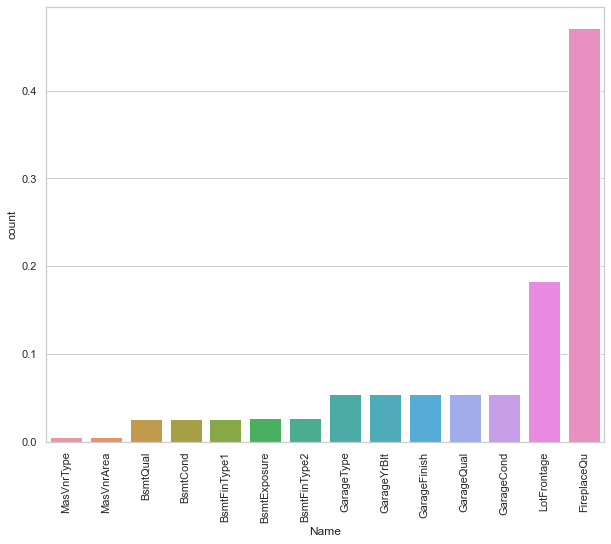

In [21]:
#visualising missing values
miss = miss.to_frame()
miss.columns = ['count']
miss.index.names = ['Name']
miss['Name'] = miss.index

#plot the missing value count
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'Name', y = 'count', data=miss)
plt.xticks(rotation = 90)
plt.show()

## We can infer that the variable PoolQC has 99.5% missing values followed by MiscFeature, Alley, and Fence. Let's try to explore it more using bar plot to get more clearity on our understanding.

In [22]:
#missing value counts in each of features for test dataset
miss_data = test_data.isnull().sum()/len(test_data)
miss_data = miss_data[miss_data > 0]
miss_data.sort_values(inplace=True)
miss_data

MasVnrType      0.003425
MasVnrArea      0.003425
Electrical      0.003425
BsmtQual        0.023973
BsmtCond        0.023973
BsmtExposure    0.023973
BsmtFinType1    0.023973
BsmtFinType2    0.023973
GarageType      0.058219
GarageYrBlt     0.058219
GarageFinish    0.058219
GarageQual      0.058219
GarageCond      0.058219
LotFrontage     0.154110
FireplaceQu     0.476027
dtype: float64

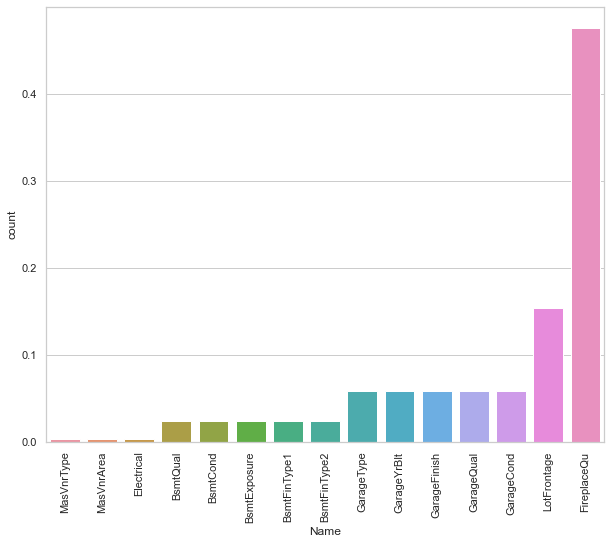

In [23]:
#visualising missing values of test dataset
miss_data = miss_data.to_frame()
miss_data.columns = ['count']
miss_data.index.names = ['Name']
miss_data['Name'] = miss_data.index

#plot the missing value count
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'Name', y = 'count', data=miss_data)
plt.xticks(rotation = 90)
plt.show()

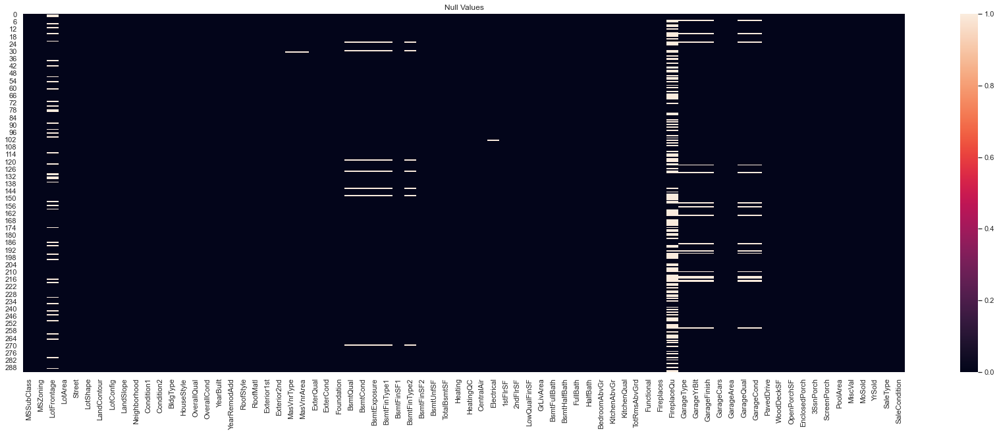

In [24]:
#Visualizeing null values in test dataset
plt.figure(figsize=[30,10])
sns.heatmap(test_data.isnull())
plt.title("Null Values")
plt.show()

# Imputation technique to replace nan values:

In [25]:
#Creating a list of categorical and numerical datatypes in train dataset
df_categorical=[]
df_numerical=[]
for col in df.columns:
    if (df[col].dtype=='object'):
          df_categorical.append(col)
    else:
        df_numerical.append(col)

In [26]:
#Creating a list of categorical and numerical datatypes in test dataset
test_data_categorical=[]
test_data_numerical=[]
for col in test_data.columns:
    if (test_data[col].dtype=='object'):
          test_data_categorical.append(col)
    else:
        test_data_numerical.append(col)

In [27]:
#Replacing null values of categorical column with mode of that column in train dataset.
catcol=df.columns.values
for i in range(0,len(catcol)):
    if df[catcol[i]].dtype == "object":
        df[catcol[i]].fillna(df[catcol[i]].mode()[0], inplace=True)

In [28]:
#Replacing null values of categorical column with mode of that column in test dataset.
catcol1=test_data.columns.values
for i in range(0,len(catcol1)):
    if test_data[catcol1[i]].dtype == "object":
        test_data[catcol1[i]].fillna(test_data[catcol1[i]].mode()[0], inplace=True)

In [29]:
#Replacing null values of numerical column with mean of that column in train dataset.
numcol=df.columns.values
for i in range(0,len(numcol)):
    if df[numcol[i]].dtype != "object":
        df[numcol[i]].fillna(df[numcol[i]].mean(), inplace=True)

In [30]:
#Replacing null values of numerical column with mean of that column in test dataset.
numcol1=test_data.columns.values
for i in range(0,len(numcol1)):
    if test_data[numcol1[i]].dtype != "object":
        test_data[numcol1[i]].fillna(test_data[numcol1[i]].mean(), inplace=True)

In [32]:
#Checking null values again in test dataset
test_data.isnull().sum().any()

False

In [33]:
# checking null values again in train dataset

df.isnull().sum().any()

False

Now, we have successfully  replaced all null values in both train and test datasets using mean and mode for numerical and categorical features respectively..

There is no empty observations in my target column.

In [38]:
#Checking for empty observations in target column
df.loc[df['SalePrice'] == " "]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice


There is no empty observations in  our target veriable

# Feature Extraction:

In [39]:
# Converting years featues to age feature in train dataset
df['Year_SinceBuilt'] = df['YearBuilt'].max() - df['YearBuilt']
df['Year_SinceRemodAdded'] = df['YearRemodAdd'].max() - df['YearRemodAdd']
df['Year_SinceSold'] = df['YrSold'].max() - df['YrSold']
df['GarageAge'] = df['GarageYrBlt'].max() - df['GarageYrBlt']

In [40]:
# Dropping old columns in train dataset
df.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

In [41]:
# Converting years column to age column in test dataset
test_data['Year_SinceBuilt'] = test_data['YearBuilt'].max() - test_data['YearBuilt']
test_data['Year_SinceRemodAdded'] = test_data['YearRemodAdd'].max() - test_data['YearRemodAdd']
test_data['Year_SinceSold'] = test_data['YrSold'].max() - test_data['YrSold']
test_data['GarageAge'] = test_data['GarageYrBlt'].max() - test_data['GarageYrBlt']

In [42]:
# Dropping old columns in test dataset
test_data.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

we  have converted all the year feature into there respective age, thinking that age will help us more than year in both train and test datasets.

In [43]:
#Checking description of data set in train dataset
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,181477.005993,39.069349,25.241438,2.195205,31.806159
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,79105.586863,30.145255,20.785185,1.329738,24.198559
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,130375.000000,10.000000,6.000000,1.000000,9.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,163995.000000,38.000000,17.000000,2.000000,31.806159
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,215000.000000,56.000000,44.000000,3.000000,48.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,755000.000000,135.000000,60.000000,4.000000,110.000000


In [44]:
#Checking description of data set in test dataset
test_data.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,46.157534,557.315068,1042.767123,1133.691781,339.657534,3.702055,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,28.184932,6.232877,36.383562,24.705479,2.140411,30.240000
std,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,152.467119,411.043768,424.561153,366.941919,424.278825,38.219527,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,224.036218,2.774556,30.447016,20.105792,1.322867,23.161183
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,4.000000,8.000000,6.750000,1.000000,8.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,0.000000,487.000000,971.000000,1047.500000,0.000000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,0.000000,6.000000,33.000000,16.000000,2.000000,30.240000
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,0.000000,780.000000,1322.000000,1370.500000,717.000000,0.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,0.000000,8.000000,55.000000,42.000000,3.000000,45.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1085.000000,1935.000000,3094.000000,2402.000000,1589.000000,479.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,3500.000000,12.000000,137.000000,60.000000,4.000000,94.000000


> # Exploratory Data Analysis

**We know that lot of factors which influences in determination of housing price. One by One we will here explore different factors & its relation to target Variable SalePrice.**

**Location of House including infrastructure, availability of public utilities, Street Size & Street Type are vital for buying house in terms in determination of Price of house.**

#### MSZoning Description :-
- **MSZoning: Identifies the general zoning classification of the sale.**
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density

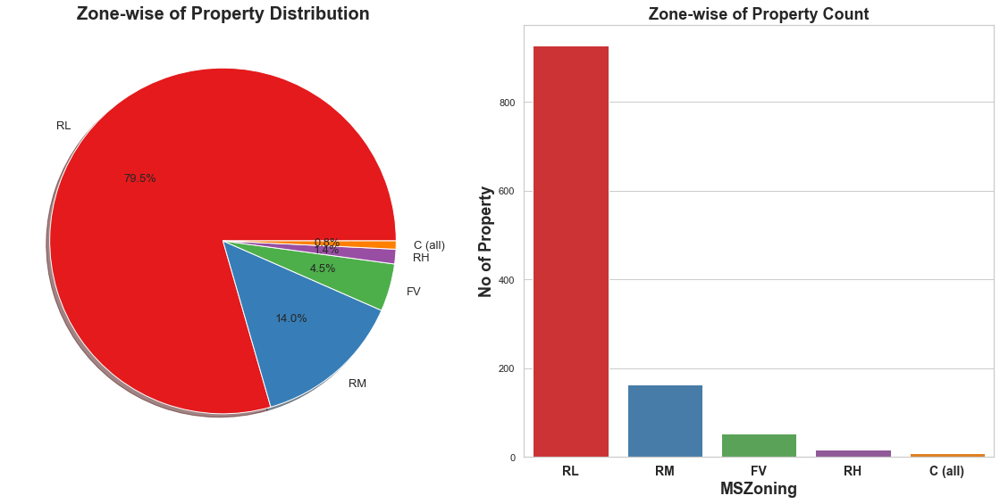

In [43]:
# Exploring MSZoning Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('Set1')
f,ax=plt.subplots(1,2,figsize=(16,8))
df['MSZoning'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={ 'fontsize':13}, ax=ax[0],shadow=True)
ax[0].set_title('Zone-wise of Property Distribution', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.countplot('MSZoning',data=df,ax=ax[1])
ax[1].set_title('Zone-wise of Property Count',fontsize=18,fontweight ='bold')
ax[1].set_xlabel("MSZoning",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("No of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation:
- **79.5% of House properties belongs to Low Density Residential Area followed by 14 % of properties belong to Medium  Density Residential Area.**
- **Very Few property (0.8%) belongs to Commerical zone.**

***Lets explore Zone relation with respect to Sale Price***

#### Observation :
- **Most of property for sale have <u>overall condition rating of either 5 or 6.</u>**
- **We already know of 80% of housing data belongs to Low density Residential Area and Now we can see in Swramplot that Sale Price inside RL Zone is much higher than other remaining zone.**
- **Cheapest properties are available in Commerical zone.**
- **Another interesting observation we get here is for some house properties having Overall condition Rating of 8 & 9 have low price compare to others. <u>This indicate that Overall Condition Rating is Not significant factor in determination of Sale price.</u> Overall Condition Rating may helpful to buyer in taking decision of Buying property but not in determination of House Price.**

***There may be other factors like Street Size or House Size may have major correlation with Sale Price.***

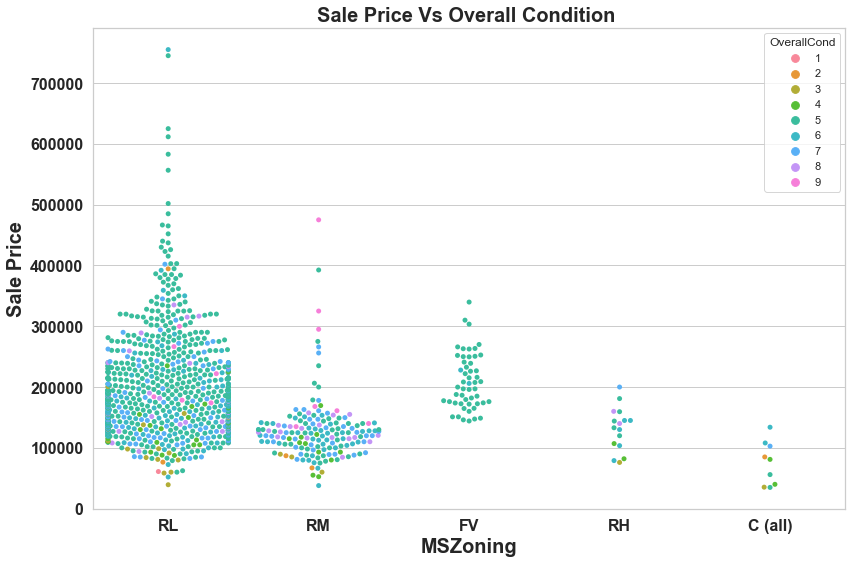

In [44]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('gnuplot2_r')
plt.figure(figsize=(12,8))
sns.swarmplot(y=df['SalePrice'], x=df['MSZoning'], hue =df['OverallCond'])
plt.title("Sale Price Vs Overall Condition ",fontsize=20,fontweight ='bold')
plt.xlabel('MSZoning',fontsize = 20,fontweight ='bold')
plt.ylabel('Sale Price',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observation :
- **Most of property for sale have <u>overall condition rating of either 5 or 6.</u>**
- **We already know of 80% of housing data belongs to Low density Residential Area and Now we can see in Swramplot that Sale Price inside RL Zone is much higher than other remaining zone.**
- **Cheapest properties are available in Commerical zone.**
- **Another interesting observation we get here is for some house properties having Overall condition Rating of 8 & 9 have low price compare to others. <u>This indicate that Overall Condition Rating is Not significant factor in determination of Sale price.</u> Overall Condition Rating may helpful to buyer in taking decision of Buying property but not in determination of House Price.**

***There may be other factors like Street Size or House Size may have major correlation with Sale Price.***

**LotFrontage: Linear feet of street connected to property**

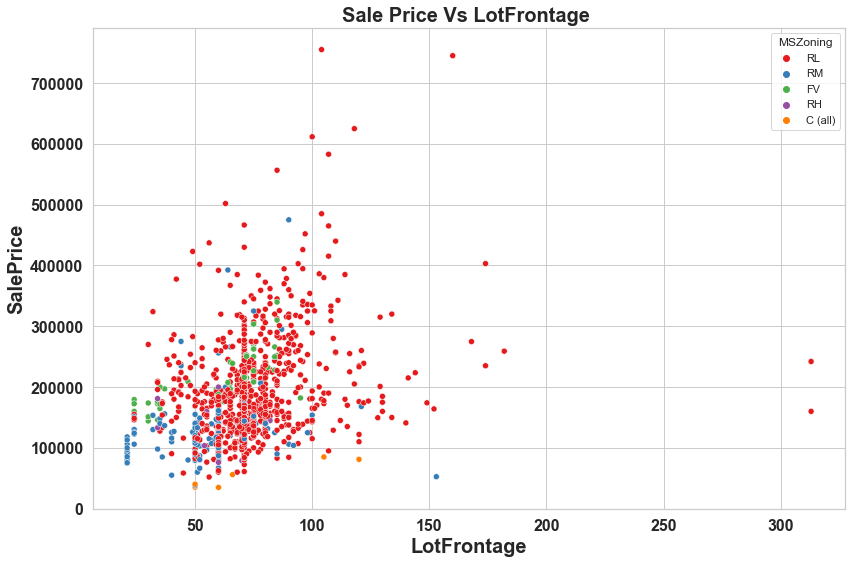

In [45]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('Set1')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['LotFrontage'], hue =df['MSZoning'])
plt.title("Sale Price Vs LotFrontage ",fontsize=20,fontweight ='bold')
plt.xlabel('LotFrontage',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

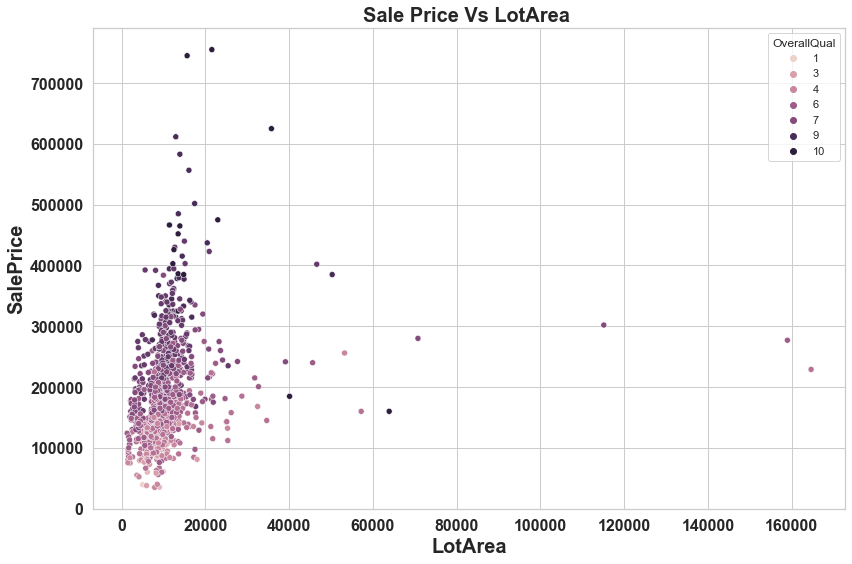

In [46]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['LotArea'], hue =df['OverallQual'])
plt.title("Sale Price Vs LotArea ",fontsize=20,fontweight ='bold')
plt.xlabel('LotArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observation:
- **There is <u>No Significant relationship</u> found between Sale price & Lot area.**
***
**Here we get Important Observation that -**

<u>***As Overall Quality of House Increase the Sale Price of House also Increases.***</u>

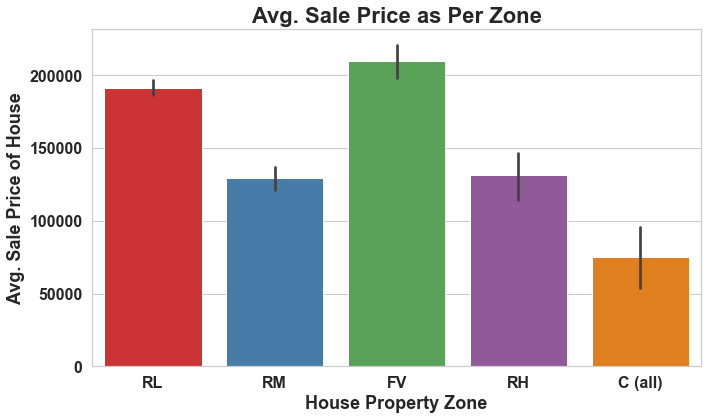

In [47]:
plt.rcParams['figure.autolayout'] = True
sns.set_palette("Set1")
plt.figure(figsize = (10,6))
sns.barplot(y = df['SalePrice'], x= df['MSZoning'])
plt.title('Avg. Sale Price as Per Zone', fontsize=22, fontweight='bold')
plt.xlabel('House Property Zone', fontsize= 18, fontweight='bold')
plt.ylabel('Avg. Sale Price of House', fontsize=18, fontweight= 'bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

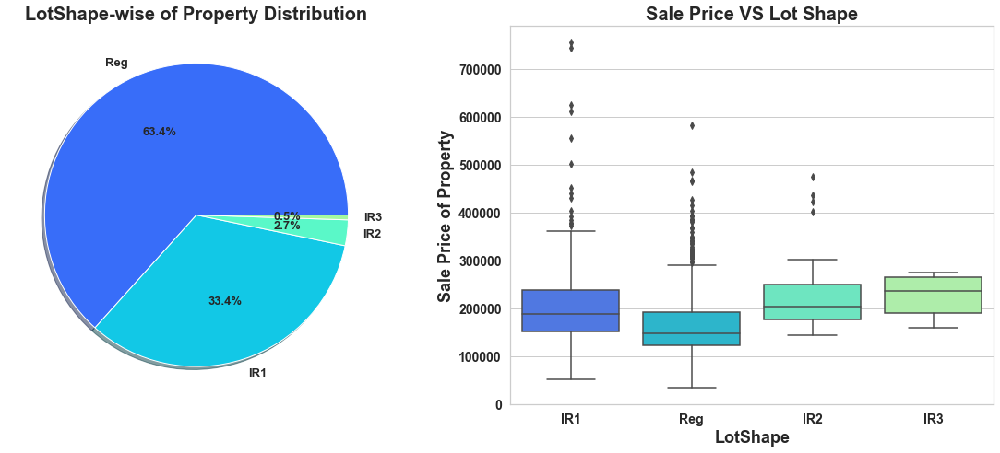

In [48]:
# Exploring LotShape Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
f,ax=plt.subplots(1,2,figsize=(16,7))
df['LotShape'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={ 'fontsize':13,'fontweight':'bold'}, ax=ax[0],shadow=True)
ax[0].set_title('LotShape-wise of Property Distribution', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.boxplot(y=df['SalePrice'], x=df['LotShape'], ax=ax[1])
ax[1].set_title('Sale Price VS Lot Shape',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("LotShape",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

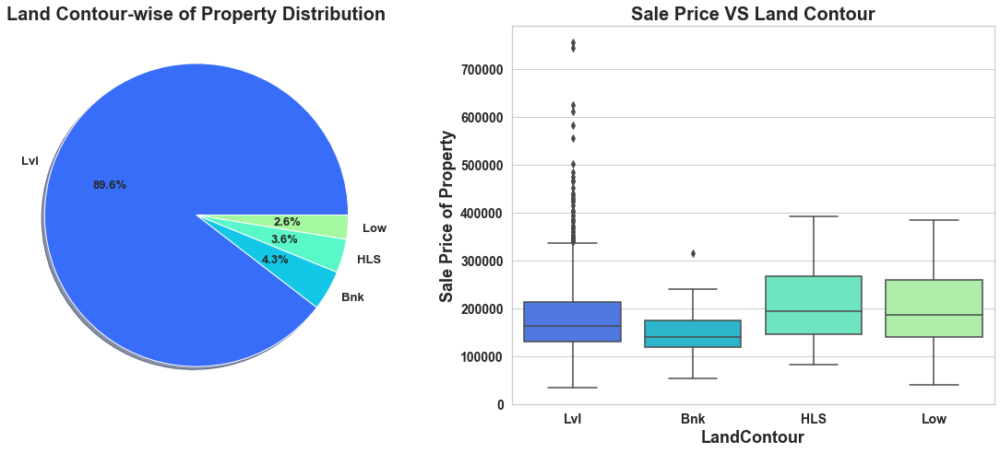

In [49]:
# Exploring LandContour Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow')
f,ax=plt.subplots(1,2,figsize=(16,7))
df['LandContour'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={ 'fontsize':13,'fontweight':'bold'}, ax=ax[0],shadow=True)
ax[0].set_title('Land Contour-wise of Property Distribution', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.boxplot(y=df['SalePrice'], x=df['LandContour'], ax=ax[1])
ax[1].set_title('Sale Price VS Land Contour',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("LandContour",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

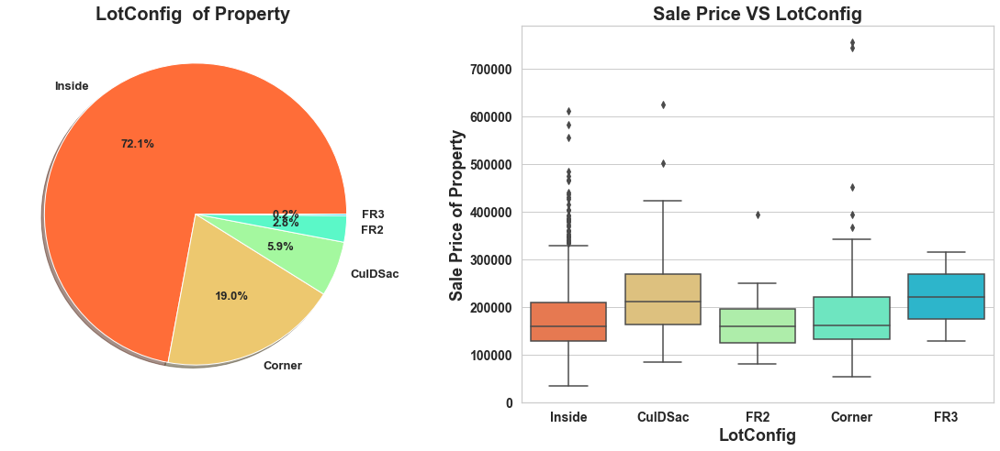

In [50]:
# Exploring LotConfig Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow_r')
f,ax=plt.subplots(1,2,figsize=(16,7))
df['LotConfig'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={'fontsize':13,'fontweight':'bold'}, ax=ax[0],shadow=True)
ax[0].set_title('LotConfig  of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.boxplot(y=df['SalePrice'], x=df['LotConfig'], ax=ax[1])
ax[1].set_title('Sale Price VS LotConfig',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("LotConfig",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation :-
- **Around 72 % of house comes with inside Lot configuration.**
- **Cul-de-sac has <u>maxmium Mean Sale Price</u> among all lot configuration.**
- **Cheapest Houses belong to <u>Inside lot configuration</u> while Costlier houses belongs to <u>Corner Lot Configuration.</u>**

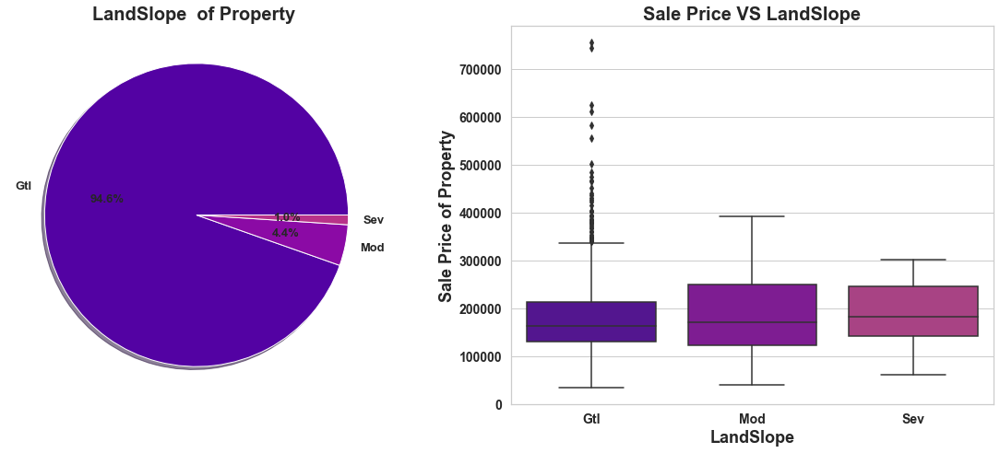

In [51]:
# Exploring LandSlope Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('plasma')
f,ax=plt.subplots(1,2,figsize=(16,7))
df['LandSlope'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={'fontsize':13,'fontweight':'bold'}, ax=ax[0],shadow=True)
ax[0].set_title('LandSlope  of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.boxplot(y=df['SalePrice'], x=df['LandSlope'], ax=ax[1])
ax[1].set_title('Sale Price VS LandSlope',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("LandSlope",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation :
- **Clearly we can see in boxplot that as Land slope increases the Sale price of house decreases.**
- **1% properties come with severe slope and they come with low price compare to Gentle Slope properties.**

#### HouseStyle Description :-
**HouseStyle: Style of dwelling**
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level

#### BldgType Description :-
**BldgType: Type of dwelling**
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit

In [52]:
Feature_grp1 = ["BldgType", "HouseStyle", "OverallQual", "OverallCond"]

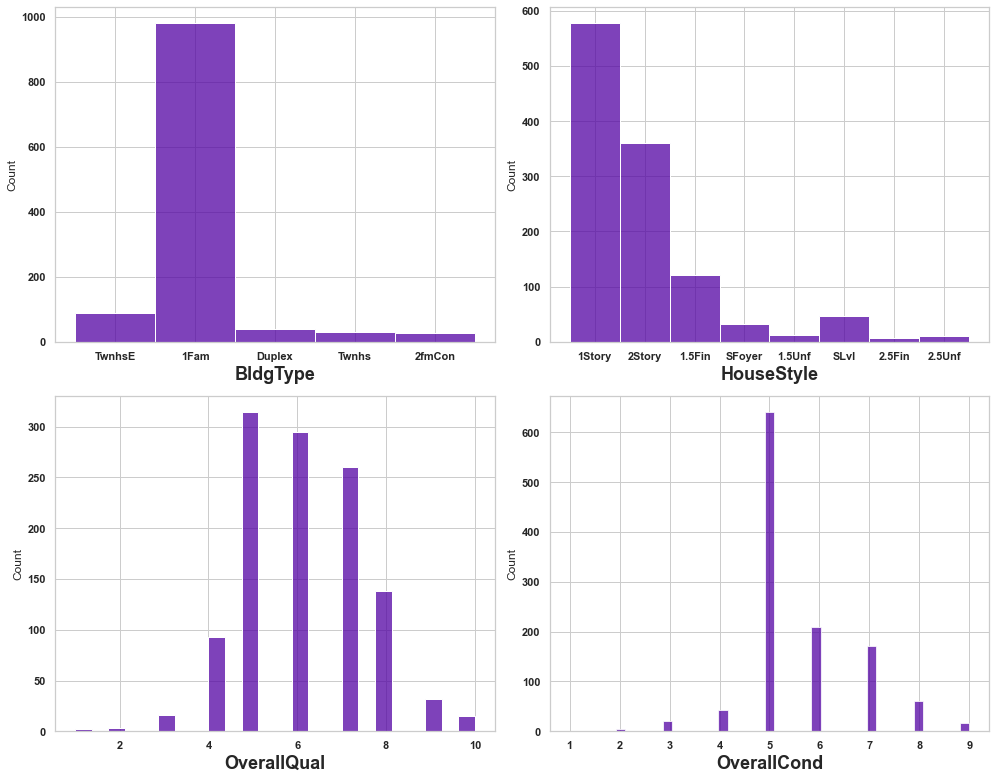

In [53]:
plt.figure(figsize=(14,11),facecolor='white')
plotnumber=1

for i in Feature_grp1:
    if plotnumber<=4:
        ax=plt.subplot(2,2,plotnumber)
        sns.histplot( df[i])
        plt.xlabel(i,fontsize=18,fontweight ='bold')
        plt.xticks(fontweight ='bold')
        plt.yticks(fontweight ='bold')
    plotnumber+=1
plt.tight_layout()
plt.show()

#### Observation :
- **More than 950 house properties are with building type Single-family Detached**
- **More than 50% of house properties comes with Overall Condition Rating of 5.**
- **More than 75% of house properties come with overall Quality Rating varies between 5 to 6.**
- **More than 500 House Properties comes with one story dwelling.** 

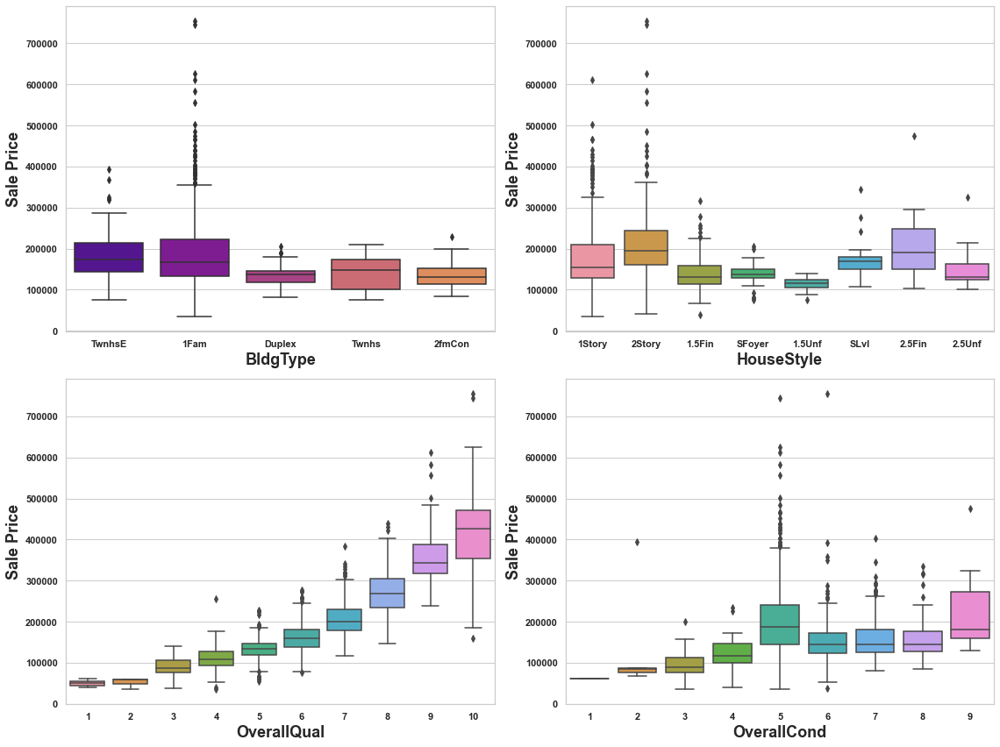

In [54]:
plt.figure(figsize=(16,12),facecolor='white')
plotnumber=1

for i in Feature_grp1:
    if plotnumber<=4:
        ax=plt.subplot(2,2,plotnumber)
        sns.boxplot(y = df['SalePrice'], x= df[i])
        plt.xlabel(i,fontsize=18,fontweight ='bold')
        plt.ylabel('Sale Price', fontsize =18, fontweight='bold')
        plt.xticks(fontweight ='bold')
        plt.yticks(fontweight ='bold')
    plotnumber+=1
plt.tight_layout()
plt.show()

In [57]:
Feature_grp2 = ["Year_SinceBuilt", "Year_SinceRemodAdded", "GarageAge"]

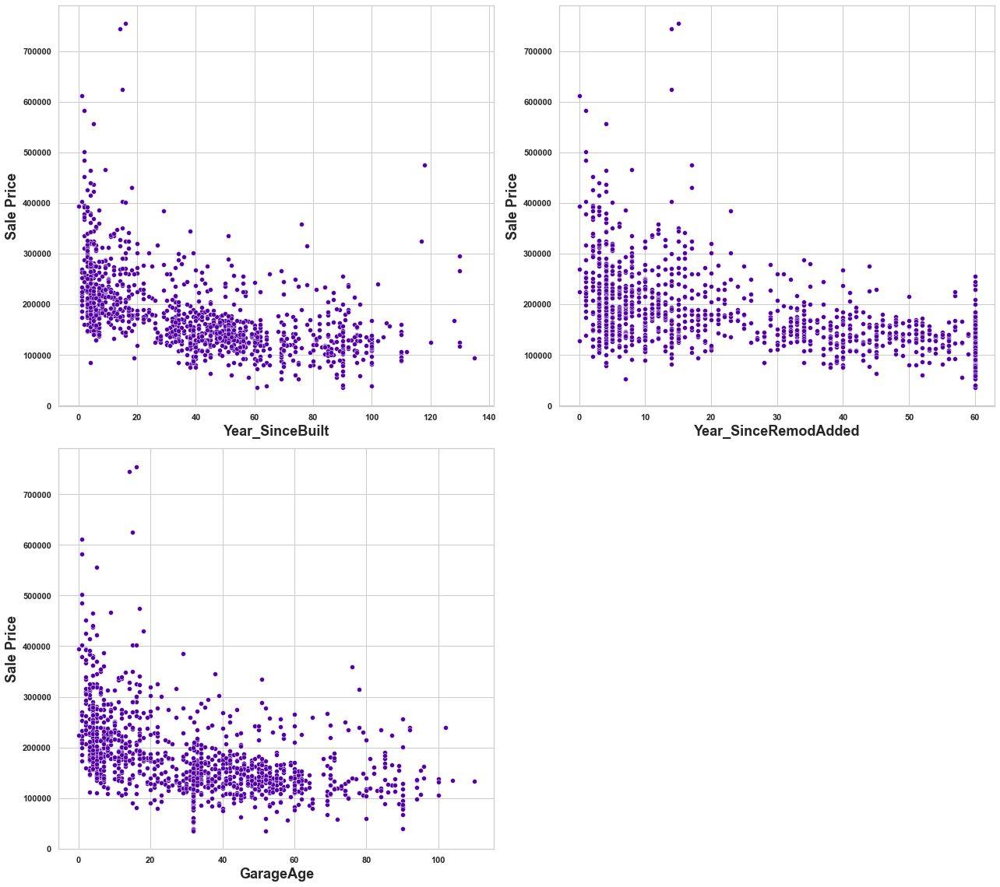

In [58]:
plt.figure(figsize=(18,16),facecolor='white')
plotnumber=1

for i in Feature_grp2:
    if plotnumber<=4:
        ax=plt.subplot(2,2,plotnumber)
        sns.scatterplot(y = df['SalePrice'], x= df[i])
        plt.xlabel(i,fontsize=18,fontweight ='bold')
        plt.ylabel('Sale Price', fontsize =18, fontweight='bold')
        plt.xticks(fontweight ='bold')
        plt.yticks(fontweight ='bold')
    plotnumber+=1
plt.tight_layout()
plt.show()

#### Observation :-
- **We can see that as Property get older with time its sale Price get depricates.**
- **20 years after Remodelling Price of properties start decreases.**
- **Older the garage age less the price of Property.**

#### SaleType Description :-
**SaleType : Type of sale**
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other

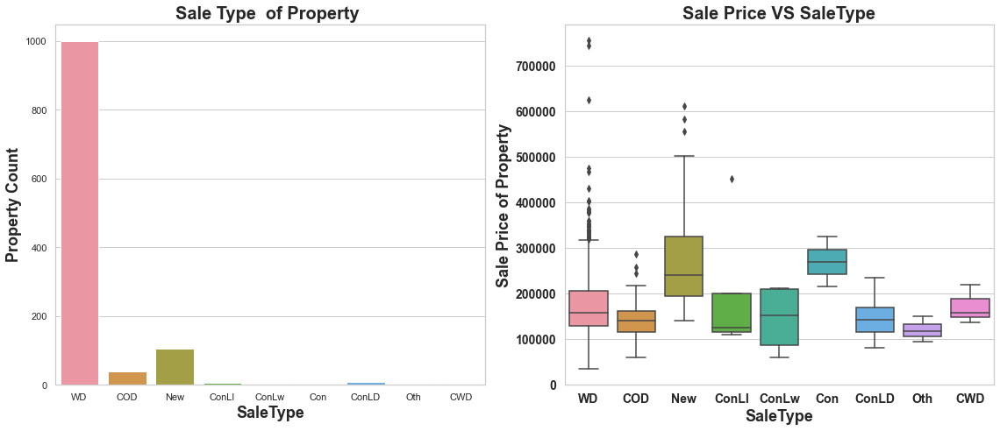

In [59]:
# Exploring SaleType Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('gnuplot_r')
f,ax=plt.subplots(1,2,figsize=(16,7))
sns.countplot('SaleType',data=df,ax=ax[0])
ax[0].set_title('Sale Type  of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('Property Count', fontsize=18,fontweight ='bold')
ax[0].set_xlabel('SaleType', fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')

sns.boxplot(y=df['SalePrice'], x=df['SaleType'], ax=ax[1])
ax[1].set_title('Sale Price VS SaleType',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("SaleType",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### SaleCondition Description :-
**SaleCondition: Condition of sale**

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds,typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

#### Observation :-
- **Around 1000 sales happen by Conventional Warranty Deed.** 
- **Home just constructed and sold category are exceptionally much costiler than any one else.**
- **All loan based sale are below 300000.**

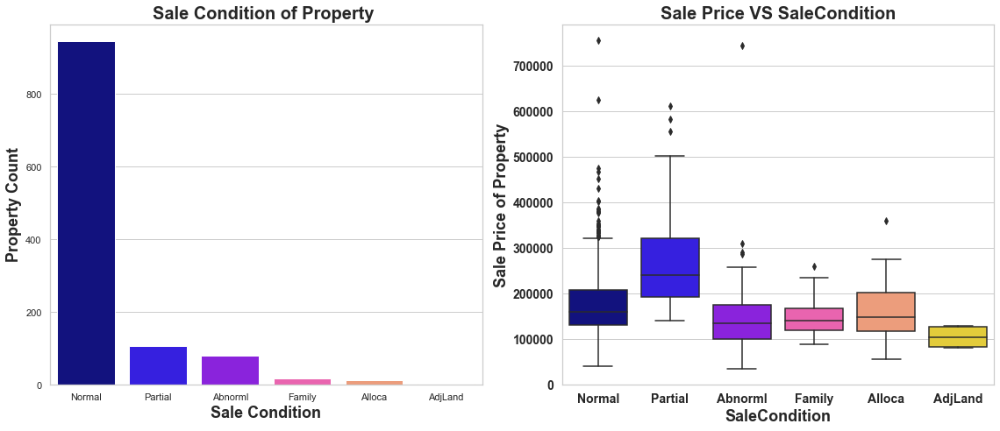

In [60]:
# Exploring SaleCondition Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('gnuplot2')
f,ax=plt.subplots(1,2,figsize=(16,7))
sns.countplot('SaleCondition',data=df,ax=ax[0])
ax[0].set_title('Sale Condition of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('Property Count', fontsize=18,fontweight ='bold')
ax[0].set_xlabel('Sale Condition', fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')

sns.boxplot(y=df['SalePrice'], x=df['SaleCondition'], ax=ax[1])
ax[1].set_title('Sale Price VS SaleCondition',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("SaleCondition",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation :-
- **We can see that Sale with condition like Abnorml, Family, Alloca, AdjLand are below the price of 300000.**
- **Maximum Base Price for House comes from Partial category- Home was not completed when last assessed (associated with New Homes) is higher than rest.**
- **Minimum base price comes from Normal condition sale and also highest sale price comes from this category.**

#### **Investigation of Relation between Floor Area and Sale Price**

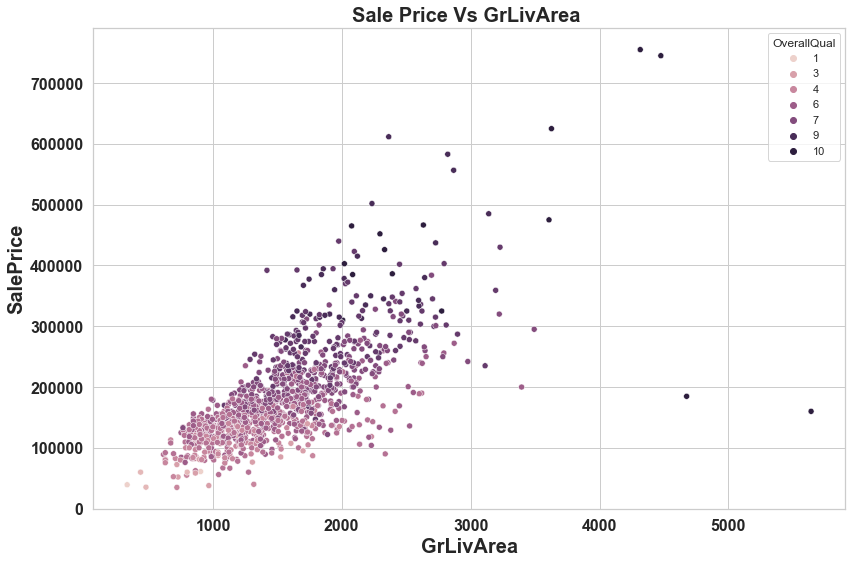

In [61]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['OverallQual'])
plt.title("Sale Price Vs GrLivArea ",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

> **It is common known fact that as Floor area increases the cost of Properties get increases.**
***
***Some of Property are single story while others are 2 story. In this Section we will explore relation between Grand Total Floor space (in square feet ) with Sale Price***

- **Note - We also know as Quality Rating increase Price of House increase so we incorparate Overall Quality Rating in exploration.**

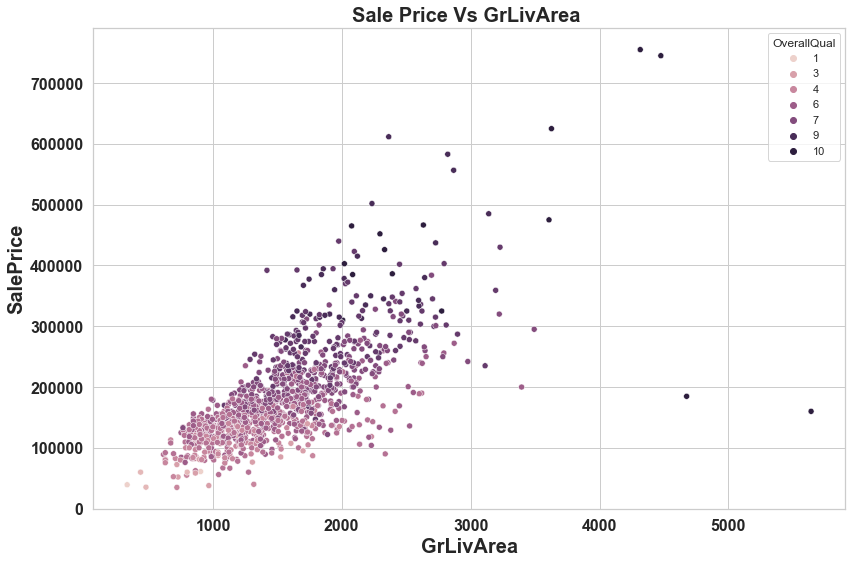

In [62]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['OverallQual'])
plt.title("Sale Price Vs GrLivArea ",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observation :- 
**In above plot we can clearly see relation between all three feature very clearly.**

***As total floor area increases the sale price also get increases corresponding the overall quality of House.***


#### **RoofStyle Description** :-
RoofStyle: Type of roof

       Flat	     Flat
       Gable	    Gable
       Gambrel	  Gabrel (Barn)
       Hip	      Hip
       Mansard	  Mansard
       Shed	     Shed

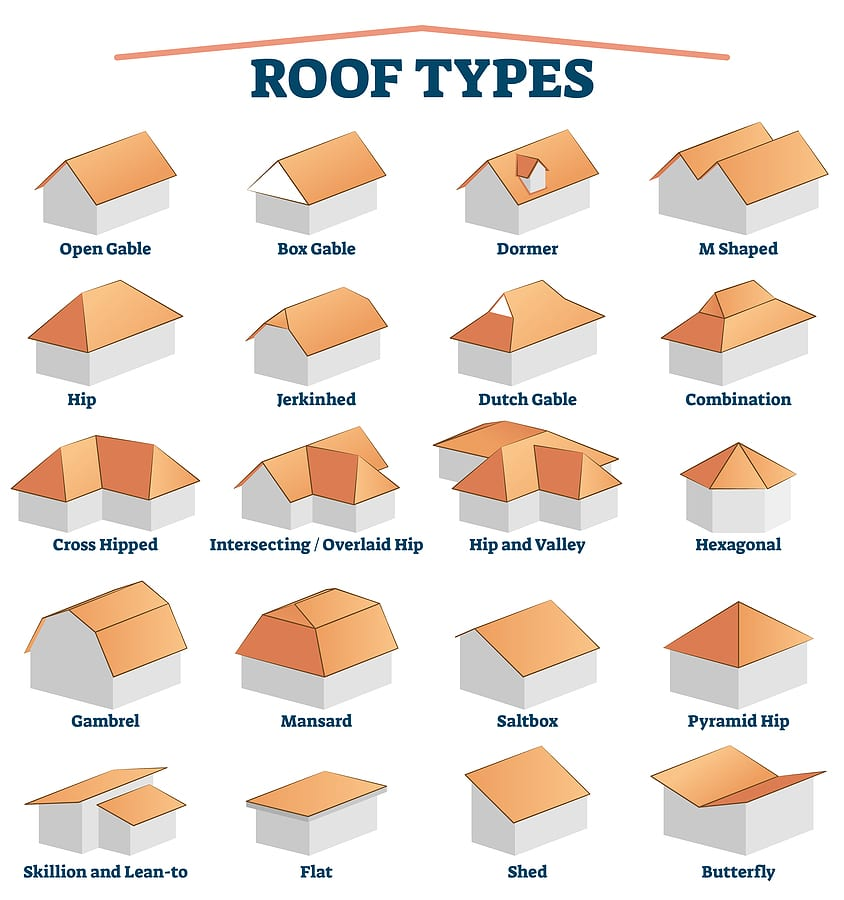

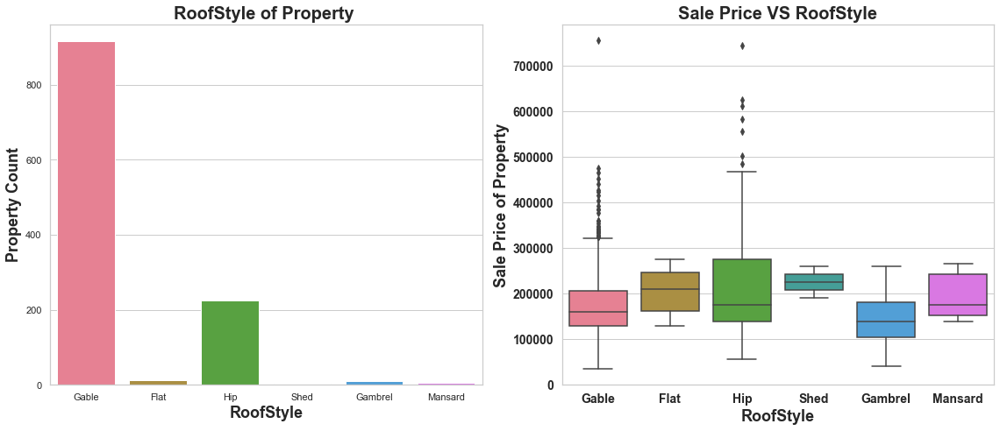

In [63]:
# Exploring RoofStyle Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('husl')
f,ax=plt.subplots(1,2,figsize=(16,7))
sns.countplot('RoofStyle',data=df,ax=ax[0])
ax[0].set_title('RoofStyle of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('Property Count', fontsize=18,fontweight ='bold')
ax[0].set_xlabel('RoofStyle', fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')

sns.boxplot(y=df['SalePrice'], x=df['RoofStyle'], ax=ax[1])
ax[1].set_title('Sale Price VS RoofStyle',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("RoofStyle",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation :-
- **More than <u>75% House properties come with Gable Roof Style</u> followed by around <u>15 % house properties with Hip Style.</u>**
- **From Boxplot we can see that <u>Hip style Roof are much costlier</u> than remaining roof style.**

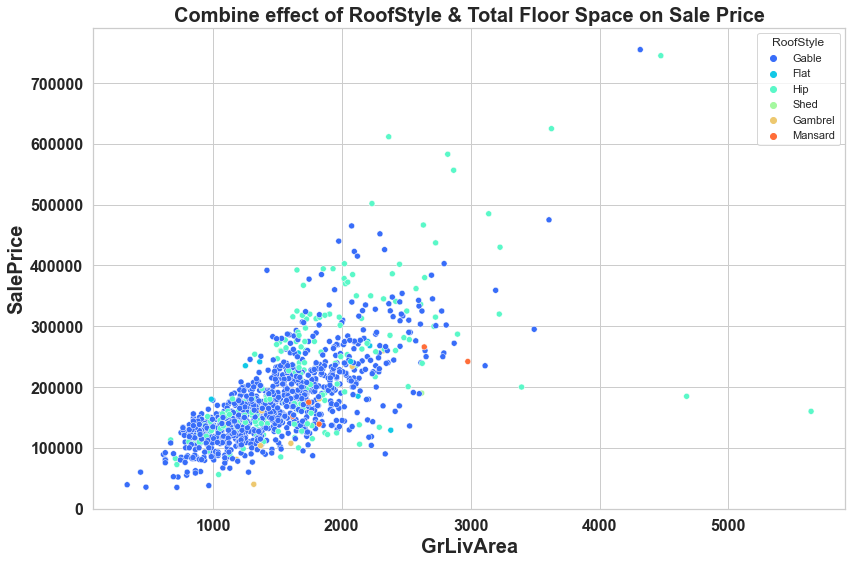

In [64]:
# Combine effect of RoofStyle & Total Floor Space on Sale Price
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['RoofStyle'])
plt.title("Combine effect of RoofStyle & Total Floor Space on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observation :-
***For High floor area construction mainly Hip style Roof is used and invariably high cost properties mostly comes up with Hip Style Roof.***

#### **RoofMatl Description** :-
**RoofMatl: Roof material**

       ClyTile	   Clay or Tile
       CompShg	   Standard (Composite) Shingle
       Membran	   Membrane
       Metal	     Metal
       Roll	      Roll
       Tar&Grv	   Gravel & Tar
       WdShake	   Wood Shakes
       WdShngl	   Wood Shingles

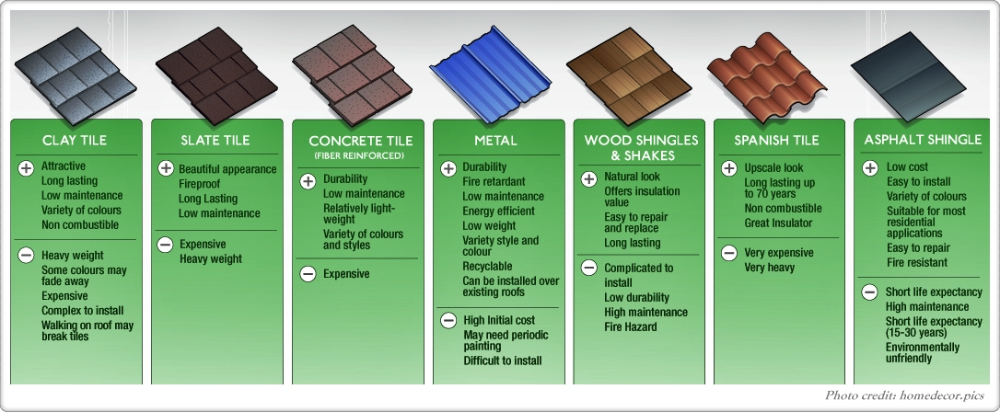

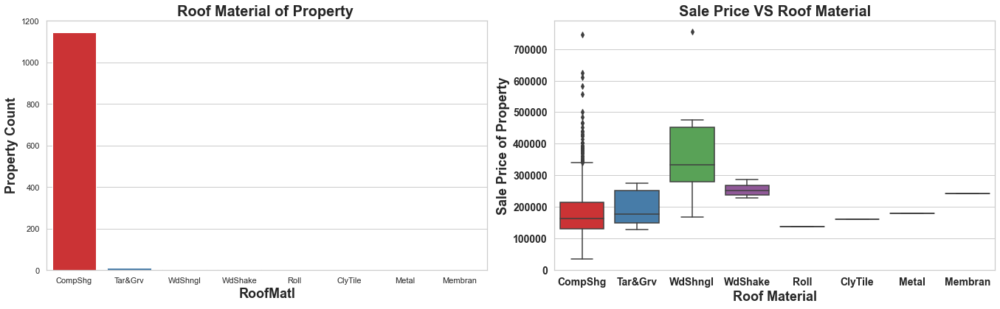

In [65]:
# Exploring RoofMatl Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('Set1')
f,ax=plt.subplots(1,2,figsize=(19,6))
sns.countplot('RoofMatl',data=df,ax=ax[0])
ax[0].set_title('Roof Material of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('Property Count', fontsize=18,fontweight ='bold')
ax[0].set_xlabel('RoofMatl', fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')

sns.boxplot(y=df['SalePrice'], x=df['RoofMatl'], ax=ax[1])
ax[1].set_title('Sale Price VS Roof Material',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("Roof Material",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### Observation :-
- **More than 90% Properties in Data set made with roof material of Standard (Composite) Shingle.**
- **Wood Shingles is Costiler Material compare to rest.**

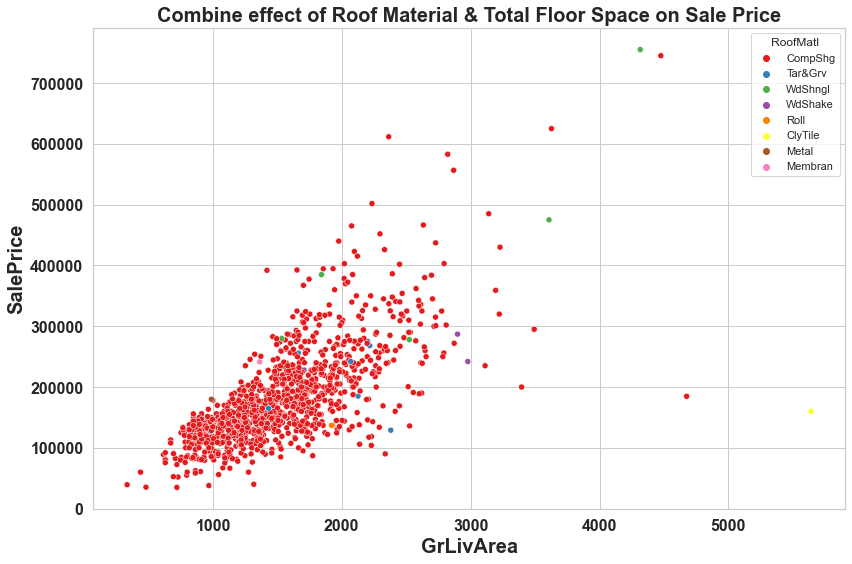

In [66]:
# Combine effect of RoofMatl & Total Floor Space on Sale Price
plt.rcParams['figure.autolayout']= True
sns.set_palette('Set1')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['RoofMatl'])
plt.title("Combine effect of Roof Material & Total Floor Space on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Exploration of House Exterior covering features

In [67]:
Feature_grp3 = ["Exterior1st","Exterior2nd", "MasVnrType", "ExterQual", "ExterCond"]

#### **Exterior Quality Description** :-
**ExterQual: Evaluates the quality of the material on the exterior**
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor

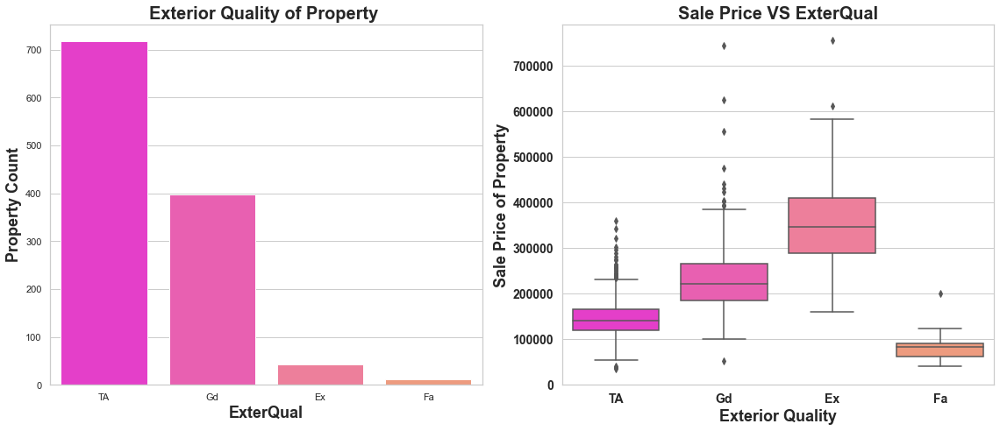

In [68]:
# Exploring ExterQual Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('spring')
f,ax=plt.subplots(1,2,figsize=(16,7))
sns.countplot('ExterQual',data=df,ax=ax[0])
ax[0].set_title('Exterior Quality of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('Property Count', fontsize=18,fontweight ='bold')
ax[0].set_xlabel('ExterQual', fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')

sns.boxplot(y=df['SalePrice'], x=df['ExterQual'], ax=ax[1])
ax[1].set_title('Sale Price VS ExterQual',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("Exterior Quality",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### **Foundation Vs Sale Price**

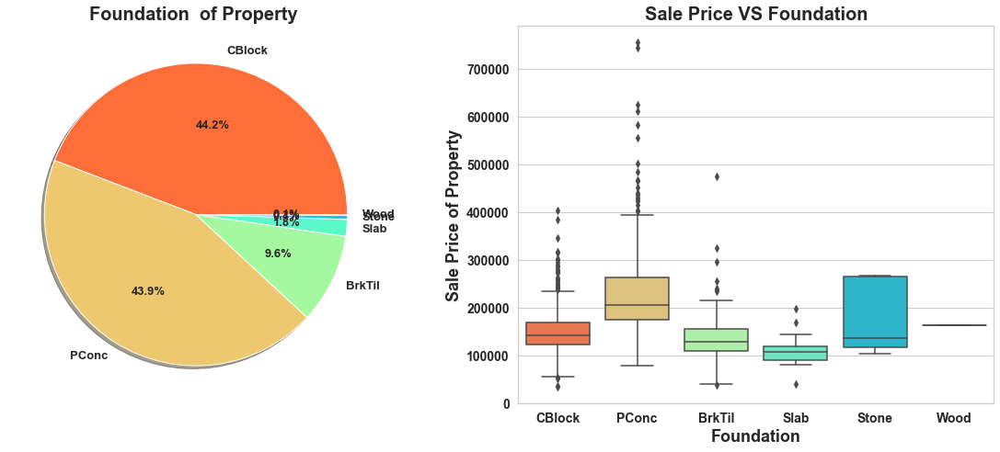

In [69]:
# Exploring LotConfig Type
plt.rcParams["figure.autolayout"] = True
sns.set_palette('rainbow_r')
f,ax=plt.subplots(1,2,figsize=(16,7))
df['Foundation'].value_counts().plot.pie(autopct='%2.1f%%',
                                          textprops ={'fontsize':13,'fontweight':'bold'}, ax=ax[0],shadow=True)
ax[0].set_title('Foundation  of Property ', fontsize=20,fontweight ='bold')
ax[0].set_ylabel('')
sns.boxplot(y=df['SalePrice'], x=df['Foundation'], ax=ax[1])
ax[1].set_title('Sale Price VS Foundation',fontsize=20,fontweight ='bold')
ax[1].set_xlabel("Foundation",fontsize=18,fontweight ='bold')
ax[1].set_ylabel("Sale Price of Property",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.show()

#### **Foundation Description :-**
**Foundation: Type of foundation**
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood

#### Observation :-
- **44.2% Properties with CBlock Foundation & 43.9% housing property come with PConc Foundation.**
- **Pconc Foundation are mostly use in costily housing properties.**

#### **Exploration of Basement related features**

In [70]:
Feature_grp4= ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']

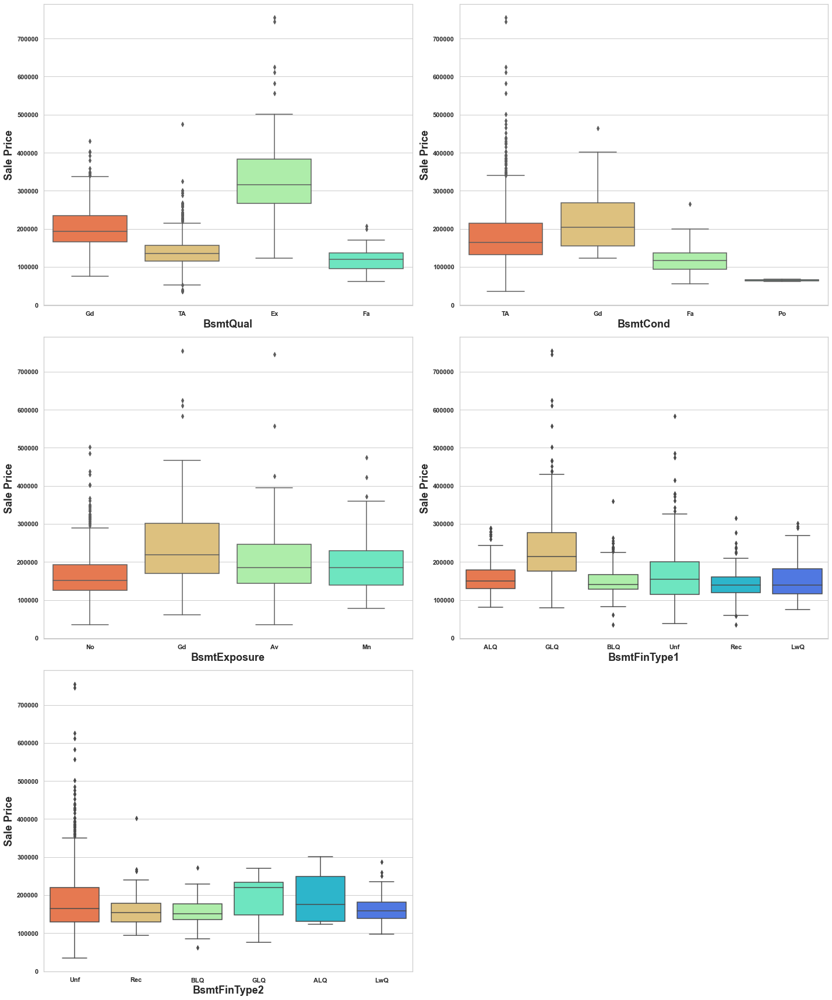

In [71]:
plt.figure(figsize=(20,24),facecolor='white')
plotnumber=1

for i in Feature_grp4:
    if plotnumber<=6:
        ax=plt.subplot(3,2,plotnumber)
        
        sns.boxplot(y = df['SalePrice'], x= df[i])
        plt.xlabel(i,fontsize=18,fontweight ='bold')
        plt.ylabel('Sale Price', fontsize =18, fontweight='bold')
        plt.xticks(fontweight ='bold')
        plt.yticks(fontweight ='bold')
    plotnumber+=1
plt.tight_layout()
plt.show()

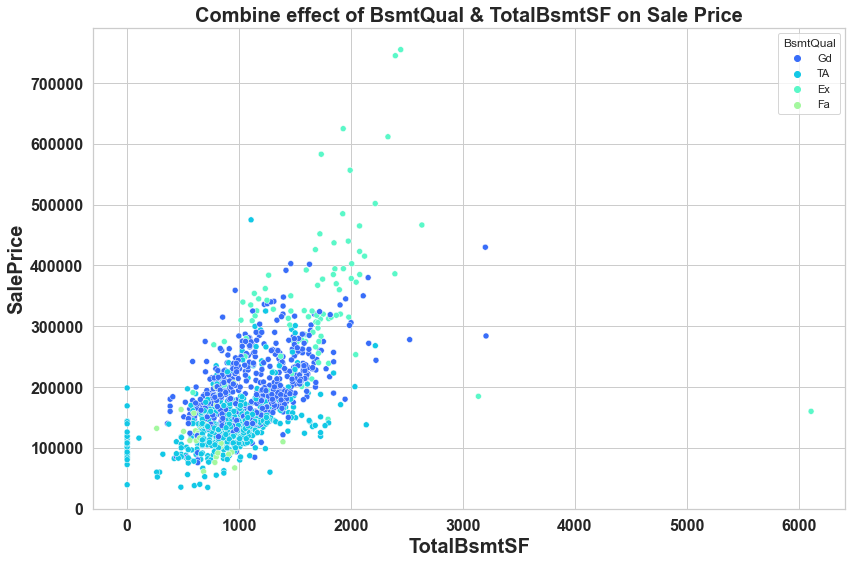

In [72]:
# Combine effect of RoofStyle & Total Floor Space on Sale Price
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,8))
sns.scatterplot(y=df['SalePrice'], x=df['TotalBsmtSF'], hue =df['BsmtQual'])
plt.title("Combine effect of BsmtQual & TotalBsmtSF on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('TotalBsmtSF',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

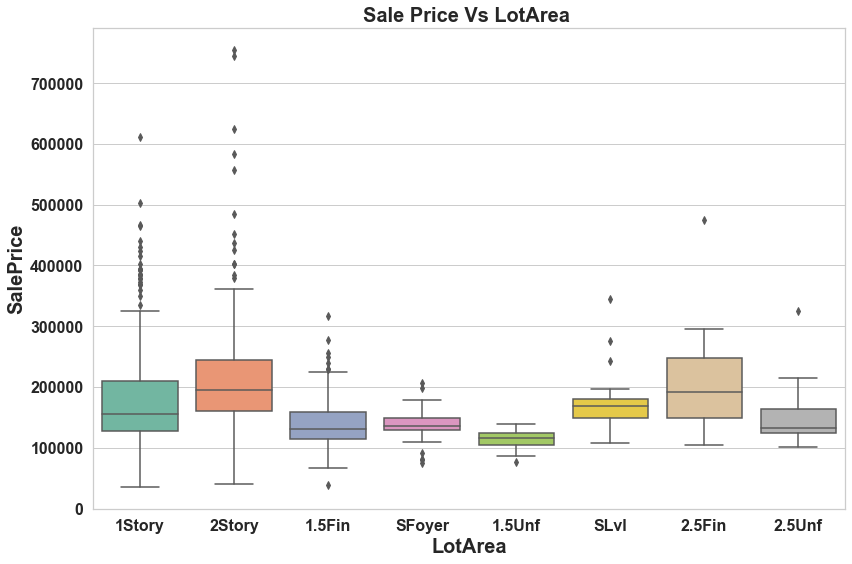

In [73]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('Set2')
plt.figure(figsize=(12,8))
sns.boxplot(y=df['SalePrice'], x=df['HouseStyle'])
plt.title("Sale Price Vs LotArea ",fontsize=20,fontweight ='bold')
plt.xlabel('LotArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

## Let's try to explore our target variable

## 1. We are exlporing our target variable using distribution plot

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

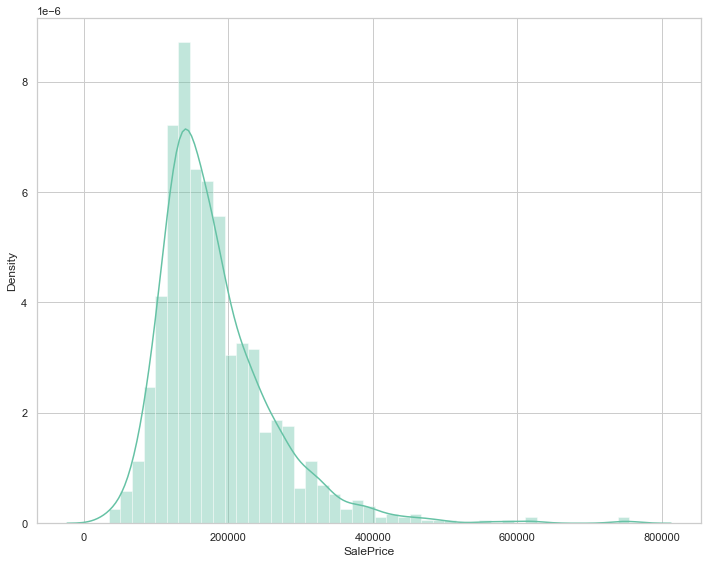

In [74]:
#SalePrice
sns.distplot(df['SalePrice'])

## We see that the target variable SalePrice has a right-skewed distribution. We'll need to log transform this variable so that it becomes normally distributed. A normally distributed (or close to normal) target variable helps in better modeling the relationship between target and independent variables. In addition, linear algorithms assume constant variance in the error term. Alternatively, we can also confirm this skewed behavior using the skewness metric.

## Now, we will check correlation behavior of numeric variables. 

**Out of 38 variables, I presume some of them must be correlated. If found, we can later remove these correlated variables as they won't provide any useful information to the model.**

In [45]:
# checking for categorical columns in train dataset
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [46]:
# Now checking for numerical columns in train dataset
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'SalePrice', 'Year_SinceBuilt', 'Year_SinceRemodAdded', 'Year_SinceSold', 'GarageAge']


In [47]:
## separate variables into new data frames
numerical_data = df.select_dtypes(include=[np.number])
catagorical_data = df.select_dtypes(exclude=[np.number])
print ("There are {} numeric and {} categorical columns in train data".format(numerical_data.shape[1],catagorical_data.shape[1]))

There are 30 numeric and 38 categorical columns in train data


<AxesSubplot:>

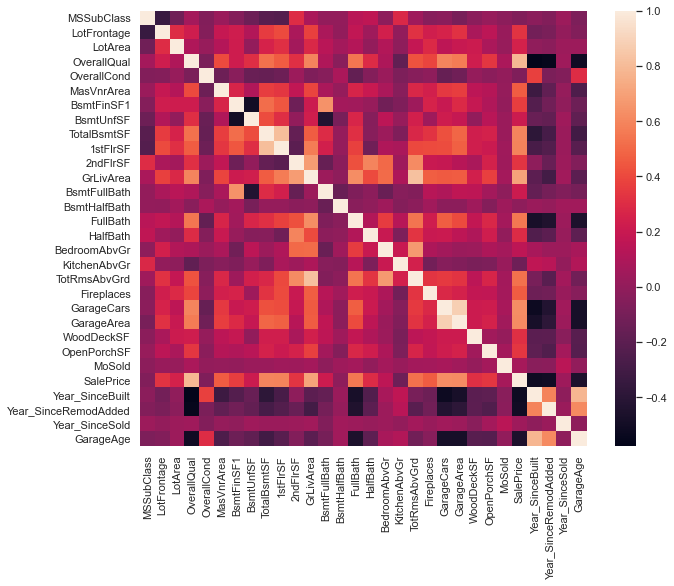

In [48]:
#correlation plot
corr = numerical_data.corr()
sns.heatmap(corr)

###  We can see the correlation of all variables against SalePrice and some variables seem to be strongly correlated with the target variable. Here, a numerical correlation score will help us understand the graph better.

In [49]:
print (corr['SalePrice'].sort_values(ascending=False)[:15], '\n') #top 15 values
print ('----------------------')
print (corr['SalePrice'].sort_values(ascending=False)[-5:]) #last 5 values`

SalePrice       1.000000
OverallQual     0.789185
GrLivArea       0.707300
GarageCars      0.628329
GarageArea      0.619000
TotalBsmtSF     0.595042
1stFlrSF        0.587642
FullBath        0.554988
TotRmsAbvGrd    0.528363
MasVnrArea      0.463626
Fireplaces      0.459611
BsmtFinSF1      0.362874
OpenPorchSF     0.339500
2ndFlrSF        0.330386
LotFrontage     0.323779
Name: SalePrice, dtype: float64 

----------------------
OverallCond            -0.065642
KitchenAbvGr           -0.132108
GarageAge              -0.458007
Year_SinceRemodAdded   -0.507831
Year_SinceBuilt        -0.514408
Name: SalePrice, dtype: float64


In [50]:
#let's check the mean price per quality and plot it.
pivot = df.pivot_table(index='OverallQual', values='SalePrice', aggfunc=np.median)
pivot

,SalePrice
OverallQual,
1,50150.0
2,60000.0
3,86250.0
4,108959.0
5,133700.0
6,160000.0
7,200120.5
8,268750.0
9,343821.5


## Observations:

- Here we see that the OverallQual feature is 79% correlated with the target variable. 
- Overallqual feature refers to the overall material and quality of the materials of the completed house.
- People usually consider these parameters for their dream house. 
- GrLivArea is 70% correlated with the target variable
- The following variables show people also care about if the house has a garage, the area of that garage, the size of the basement area, etc.

## Now, We are creating aggregated tables using pandas pivot table.

In [81]:
#let's check the mean price per quality and plot it.
pivot = df.pivot_table(index='OverallQual', values='SalePrice', aggfunc=np.median)
pivot

,SalePrice
OverallQual,
1,50150.0
2,60000.0
3,86250.0
4,108959.0
5,133700.0
6,160000.0
7,200120.5
8,268750.0
9,343821.5


<AxesSubplot:xlabel='OverallQual'>

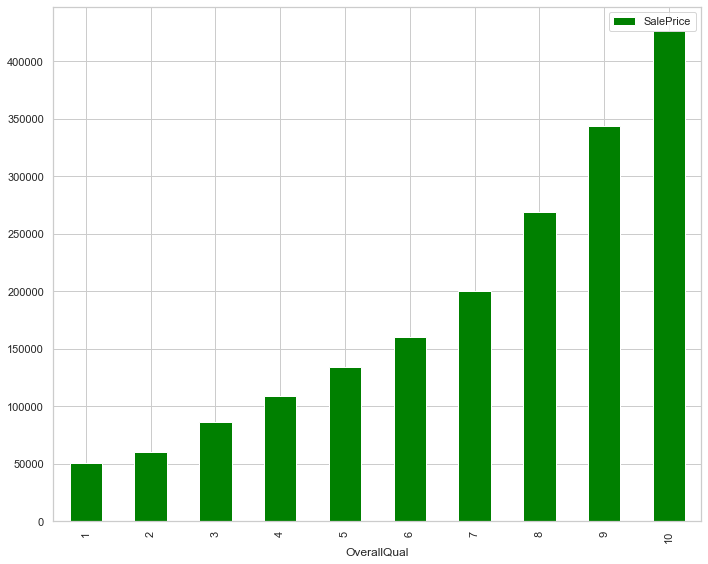

In [82]:
pivot.plot(kind='bar', color='green')

This behavior is quite normal. As the overall quality of a house increases, its sale price also increases. Let's visualize the next correlated variable GrLivArea and understand their behavior.

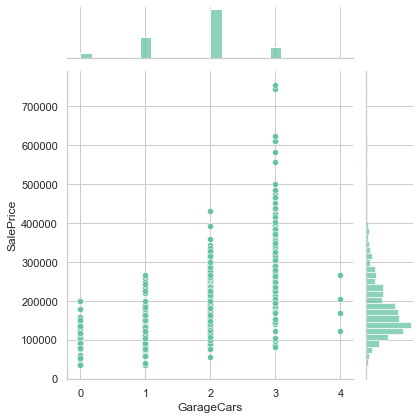

In [83]:
#GarageCars variable
sns.jointplot(x=df['GarageCars'], y=df['SalePrice'])

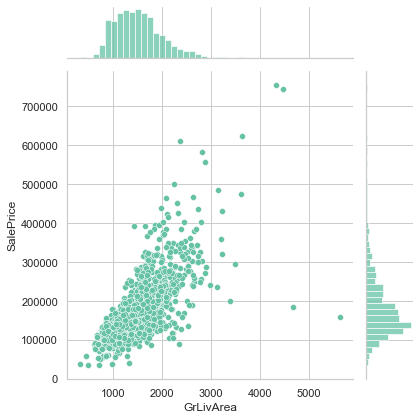

In [84]:
#GrLivArea variable
sns.jointplot(x=df['GrLivArea'], y=df['SalePrice'])

### Comments:

- As seen above, here also we see a direct correlation of living area with sale price. 
- However, we can spot an outlier value GrLivArea > 5000. 
- I've seen outliers play a significant role in spoiling a model's performance. Hence, we'll get rid of it. 

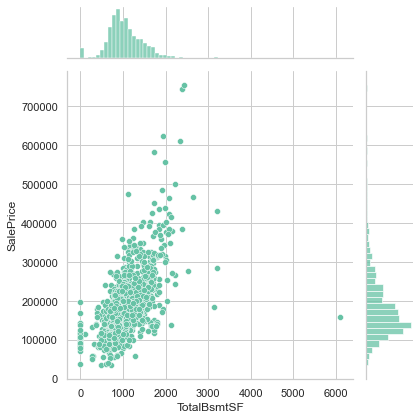

In [85]:
#TotalBsmtSF variable
sns.jointplot(x=df['TotalBsmtSF'], y=df['SalePrice'])

## Here we can spot an outlier value GrLivArea > 6000.

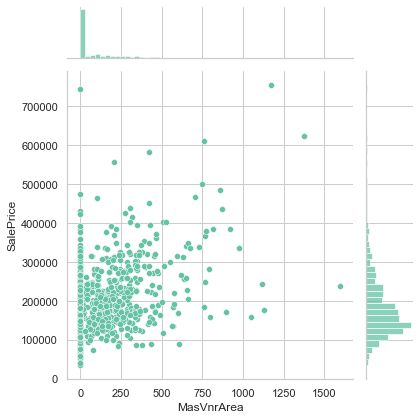

In [86]:
#MasVnrArea  variable
sns.jointplot(x=df['MasVnrArea'], y=df['SalePrice'])

Here some outlier is exist

In [87]:
catagorical_data.describe()

,MSZoning,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
count,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168
unique,5,2,4,4,5,3,25,9,8,5,8,6,8,14,15,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,9,6
top,RL,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,CBlock,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
freq,928,1164,740,1046,842,1105,182,1005,1154,981,578,915,1144,396,387,703,717,1022,516,547,1071,787,375,1033,1143,585,1090,1070,578,1085,852,755,551,1114,1125,1071,999,945


**Let's check the median sale price of a house based on its SaleCondition. SaleCondition explains the condition of sale. Not much information is given about its categories.**

In [88]:
SP_Pivot = df.pivot_table(index='SaleCondition', values='SalePrice', aggfunc=np.median)
SP_Pivot

,SalePrice
SaleCondition,
Abnorml,135000.0
AdjLand,104000.0
Alloca,148145.0
Family,140500.0
Normal,160000.0
Partial,239399.5


<AxesSubplot:xlabel='SaleCondition'>

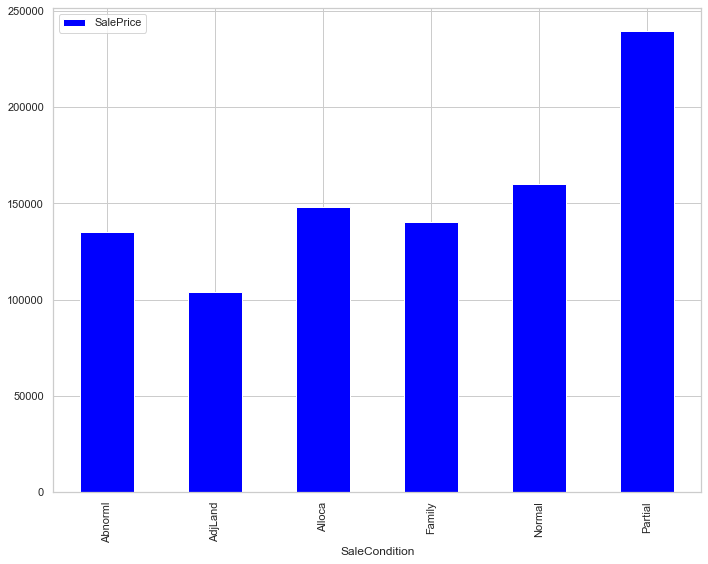

In [89]:
SP_Pivot.plot(kind='bar',color='blue')


## Observation:

1.SaleCondition Partial has the highest mean sale price.

Though, due to lack of information we can't generate many insights from this data. Moving forward, like we used correlation to determine the influence of numerical features on SalePrice. Similarly, we'll use the ANOVA test to understand the correlation between categorical variables and SalePrice. ANOVA test is a statistical technique used to determine if there exists a significant difference in the mean of groups.

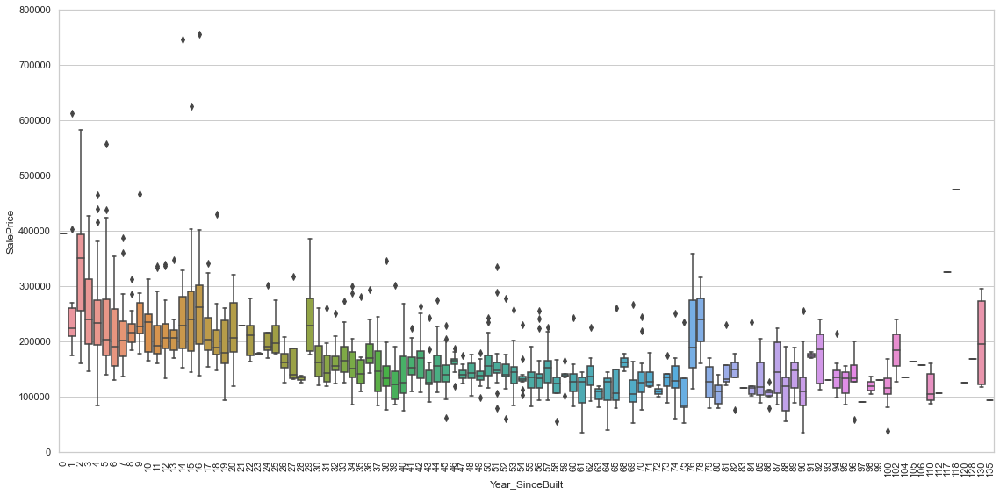

In [90]:
#year built
var  = 'Year_SinceBuilt'
data= pd.concat([df['SalePrice'], df[var]], axis =1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y='SalePrice', data=data)
fig.axis(ymin=0, ymax=800000)
plt.xticks(rotation=90);
plt.show();

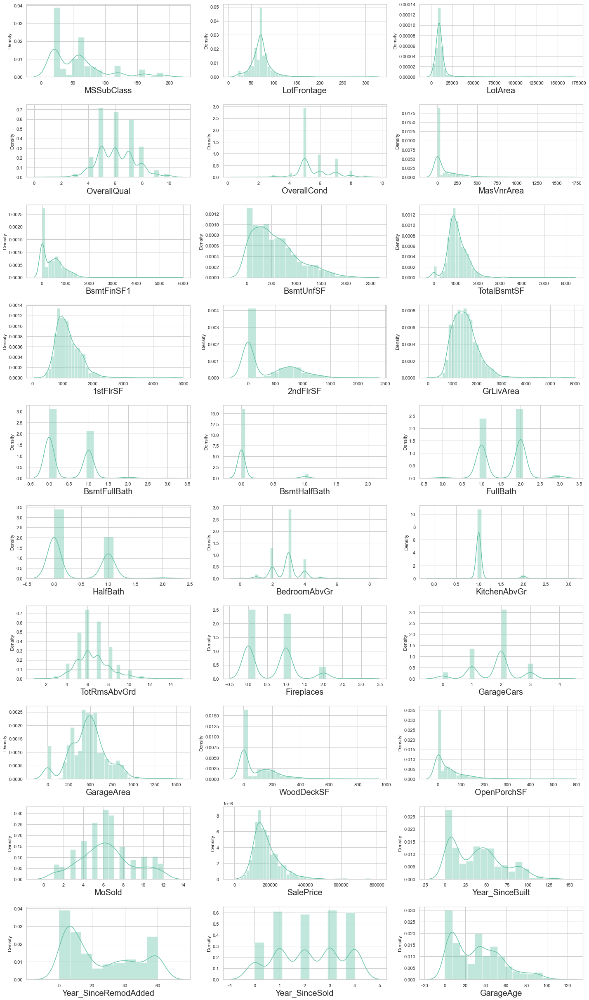

In [91]:
#Distribution plot for all numerical columns
plt.figure(figsize = (20,40))
plotnumber = 1
for column in df[numerical_columns]:
    if plotnumber <=35:
        ax = plt.subplot(12,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize = 20)
    plotnumber+=1
plt.tight_layout()


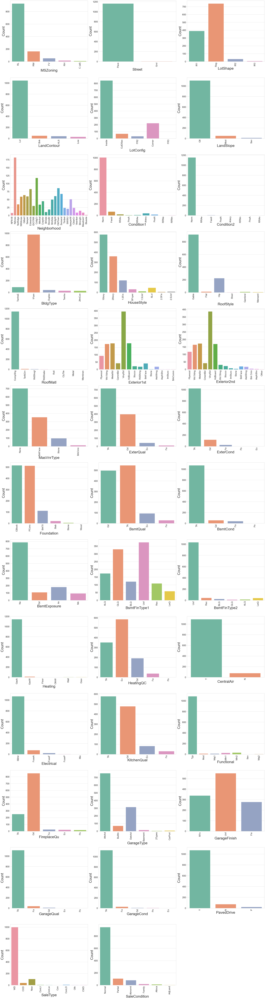

In [92]:
#Bar plot for all categorical columns
plt.figure(figsize = (40,150))
plotnumber = 1
for column in df[categorical_columns]:
    if plotnumber <=40:
        ax = plt.subplot(13,3,plotnumber)
        sns.countplot(df[column])
        plt.xticks(rotation=90,fontsize = 25)
        plt.yticks(rotation=0,fontsize = 25)
        plt.xlabel(column,fontsize = 40)
        plt.ylabel('Count',fontsize = 40)
    plotnumber+=1
plt.tight_layout()

## Observation:

- It is found that Residential Low Density zoning has maximum count, for the feature general zoning classification of the sale(MSZoning).
- In Paved streets we can observe maximum count, for the feature Type of road access to property(Street).
- Regular shaped property has maximum count, for the feature General shape of property(LotShape).
- Near Flat/Level property has maximum count, for the feature Flatness of the property(LandContour).
- Inside lot configured property has maximum count, for the feature Lot configuration(LotConfig).
- Gentle sloped property has maximum count, for the feature Slope of property(LandSlope).
- If the property is located in North Ames then count is good compared to other locations, for the feature Physical locations within Ames city limits(Neighborhood).
- If the Proximity to various conditions-1 is normal then count is high for the feature Proximity to various conditions(Condition1).
- If the Proximity to various conditions-2 is normal then count is high for the feature Proximity to various conditions (if more than one is present)(Condition2).
- Single-family Detached dwelling has maximum count for the feature Type of dwelling(BldgType).
- One story dwelling housestyle has maximum count for the feature Style of dwelling(HouseStyle).
- For Gable roof style the count is high for the feature Type of roof(RoofStyle).
- For Standard (Composite) Shingle roof material the count is high for the feature Roof material(RoofMatl).
- For Vinyl Siding exterior-1 covering on house has maximum counts for the feature Exterior covering on house(Exterior1st).
- For Vinyl Siding exterior-2 covering on house has maximum counts for the feature Exterior covering on house (if more than one material)(Exterior2nd).
- For Masonry veneer type(MasVnrType) None has maximum count.
- For Typical/Average(TA) quality of the material on the exterior has maximum count, for the feature Evaluates the quality of the material on the exterior (ExterQual).
- For Typical/Average(TA) condition of the material on the exterior has maximum count for the feature Evaluates the present condition of the material on the exterior(ExterCond).
- For Cinder Block and Poured Contrete foundations the count is maximum for the feature Type of foundation(Foundation).
- For good and average quality heights of the basement the count is high for the feature Evaluates the height of the basement(BsmtQual).
- For Typical/Average(TA) general condition of the basement the count is high for the feature Evaluates the general condition of the basement(BsmtCond)
- For No Exposure garden level walls the count is maximum for the feature Refers to walkout or garden level walls(BsmtExposure).
- For unfinished Rating of basement finished area-1 the count is maximum for the feature Rating of basement finished area(BsmtFinType1).
- For unfinished Rating of basement finished area-2 the count is maximum for the feature Rating of basement finished area (if multiple types)(BsmtFinType2).
- For Gas forced warm air furnace type of heating the count is maximum for the feature Type of heating(Heating).
- For Excellent Heating quality and condition the count is high for the feature Heating quality and condition(HeatingQC).
- For Central air conditioning-yes has maximum count for the feature Central air conditioning(CentralAir).
- For Standard Circuit Breakers & Romex Electrical system the count is high for the feature Electrical system(Electrical).
- For Typical/Average(TA) and good Kitchen quality the count is maximum for the feature Kitchen quality(KitchenQual).
- Typical Functionality has highest count for Home functionality (Assume typical unless deductions are warranted)(Functional).
- For good Fireplace quality the count is high for the feature Fireplace quality(FireplaceQu).
- If Garage location Attached to home then the count is high, for the feature Garage location(GarageType).
- For Unfinished Interior of the garage the count is maximum, for the feature Interior finish of the garage(GarageFinish).
- For Typical/Average(TA) Garage quality the count is high, for the feature Garage quality(GarageQual).
- For Typical/Average(TA) Garage condition the count is high, for the feature Garage condition(GarageCond).
- For Paved driveway the count is maximum, for the feature Paved driveway(PavedDrive).
- For Warranty Deed - Conventional type of sales the count is maximum, for the feature Type of sale(SaleType).

In [93]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,3,33.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,3,40.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,3,13.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,COD,Normal,190000,33,33,0,33.0
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,356,1602,GasA,Gd,Y,SBrkr,1602,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,Fin,2,529,TA,TA,Y,240,0,6,WD,Normal,215000,33,10,1,33.0


In [94]:
df.dtypes

MSSubClass                int64
MSZoning                 object
LotFrontage             float64
LotArea                   int64
Street                   object
LotShape                 object
LandContour              object
LotConfig                object
LandSlope                object
Neighborhood             object
Condition1               object
Condition2               object
BldgType                 object
HouseStyle               object
OverallQual               int64
OverallCond               int64
RoofStyle                object
RoofMatl                 object
Exterior1st              object
Exterior2nd              object
MasVnrType               object
MasVnrArea              float64
ExterQual                object
ExterCond                object
Foundation               object
BsmtQual                 object
BsmtCond                 object
BsmtExposure             object
BsmtFinType1             object
BsmtFinSF1                int64
BsmtFinType2             object
BsmtUnfS

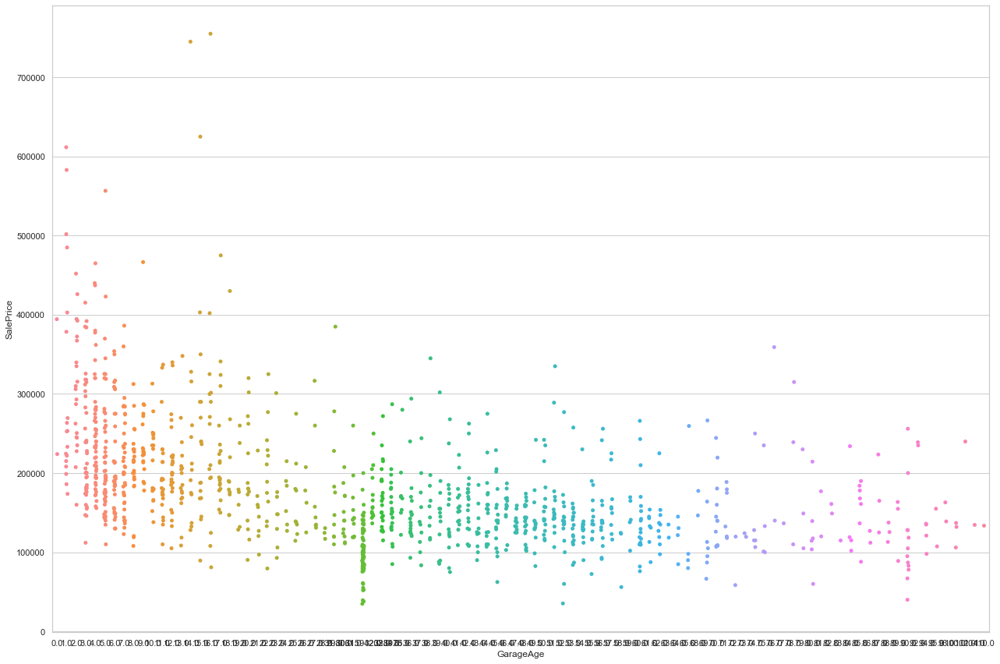

In [95]:
plt.figure(figsize=(18,12))
sns.set_style('whitegrid')
sns.stripplot(x=i,y='SalePrice',data=df)
plt.show()

In [96]:
col=['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','Year_SinceBuilt','Year_SinceRemodAdded','GarageAge']

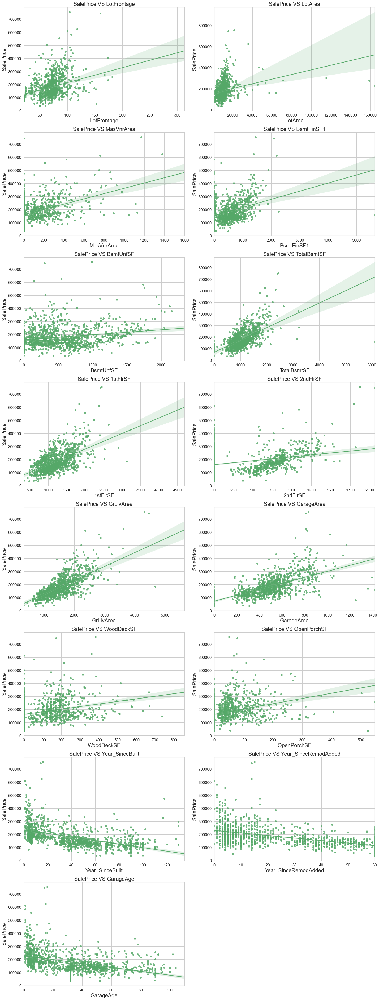

In [97]:
#regplot for numerical columns
plt.figure(figsize=(20,130))
for i in range(len(col)):
    plt.subplot(20,2,i+1)
    sns.regplot(x=df[col[i]] , y=df['SalePrice'],color="g")
    plt.title(f"SalePrice VS {col[i]}",fontsize=20)
    plt.xticks(fontsize=15)  
    plt.yticks(fontsize=15)
    plt.xlabel(col[i],fontsize = 20)
    plt.ylabel('SalePrice',fontsize = 20)
    plt.tight_layout()

**Observations:**
1.As Linear feet of street connected to property(LotFrontage) is increseing sales is decreasing and the SalePrice is rangeing between 0-3 lakhs.

2.As Lot size in square feet(LotArea) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

3.As Masonry veneer area in square feet(MasVnrArea) is increasing sales is decreasing and saleprice is rangeing between 0-4 lakhs.

4.As Type 1 finished square feet(BsmtFinSF1) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

5.As Unfinished square feet of basement area(BsmtUnfSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs. There are some outliers also.

6.As Total square feet of basement area(TotalBsmtSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

7.As First Floor square feet(1stFlrSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

8.As Second floor square feet(2ndFlrSF) is increseing sales is increasing in the range 500-1000 and the saleprice is in between 0-4 lakhs.

9.As Above grade (ground) living area square feet(GrLivArea) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

10.As Size of garage in square feet(GarageArea) is increseing sales is increseing and the saleprice is in between 0-4 lakhs.

11.As Wood deck area in square feet(WoodDeckSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

12.As Open porch area in square feet(OpenPorchSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

13.As Year_SinceBuilt is increseing sales is decreasing and the saleprice is high for newly built building and the sales price is in between 0-4 lakhs.

14.As Since Remodel date (same as construction date if no remodeling or additions)(Year_SinceRemodAdded) is increseing sales is decreasing and the saleprice is in between 1-4 lakhs.

15.As Since Year garage was built(GarageAge) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

In [98]:
col1=['MSSubClass','OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold','Year_SinceSold']

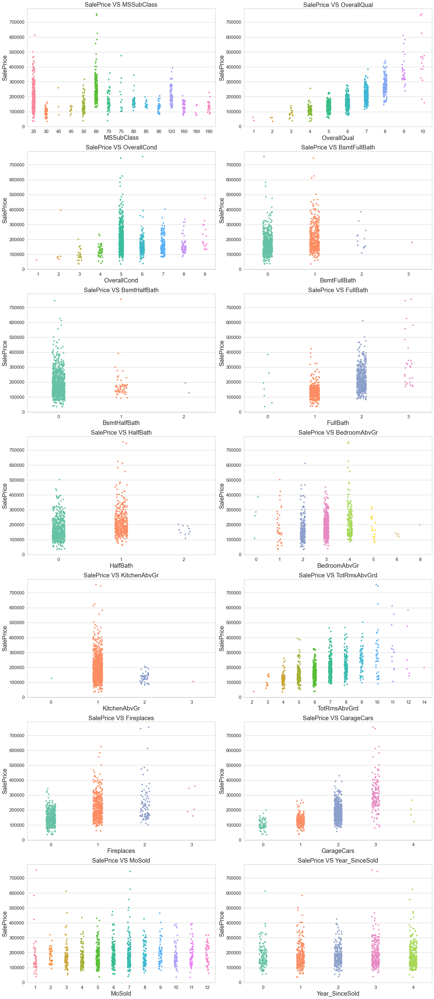

In [99]:
#stripplot for numerical columns
plt.figure(figsize=(20,130))
for i in range(len(col1)):
    plt.subplot(20,2,i+1)
    sns.stripplot(x=df[col1[i]] , y=df['SalePrice'])
    plt.title(f"SalePrice VS {col1[i]}",fontsize=20)
    plt.xticks(fontsize=15)  
    plt.yticks(fontsize=15)
    plt.xlabel(col1[i],fontsize = 20)
    plt.ylabel('SalePrice',fontsize = 20)
    plt.tight_layout()

**Observations:**
- 1.For 1-STORY 1946 & NEWER ALL STYLES(20) and 2-STORY 1946 & NEWER(60) types of dwelling(MSSuubClass) the sales is good and SalePrice is also high.
- 2.As Rates the overall material and finish of the house(OverallQual) is increasing linearly sales is also increasing And SalePrice is also increasing linearly.
- 3.For 5(Average) overall condition of the house(OverallCond) the sales is high and SalePrice is also high. 
- 4.For 0 and 1 Basement full bathrooms(BsmtFullBath) the sales as well as SalePrice is high.
- 5.For 0 Basement half bathrooms(BsmtHalfBath) the sales as well as SalePrice is high.
- 6.For 1 and 2 Full bathrooms above grade(FullBath) the sales as well as SalePrice is high.
- 7.For 0 and 1 Half baths above grade(HalfBath) the sales as well as SalePrice is high. 
- 8.For 2, 3 and 4 Bedrooms above grade (does NOT include basement bedrooms)(BedroomAbvGr) the sales as well as SalePrice is high.
- 9.For 1 Kitchens above grade(KitchenAbvGr) the sales as well as SalePrice is high. 
- 10.For 4-9 Total rooms above grade (does not include bathrooms)(TotRmsAbvGrd) the sales as well as SalePrice is high.
- 11.For 0 and 1 Number of fireplaces(Fireplaces) the sales as well as SalePrice is high.
- 12.For 1 and 2 Size of garage in car capacity(GarageCars) the sales is high and for 3 Size of garage in car capacity(GarageCars) the SalePrice is high.
- 13.In between april to august for Month Sold(MoSold) the sales is good with SalePrice.
- 14.For all the Year_SinceSold the salePrice and sales both are same.

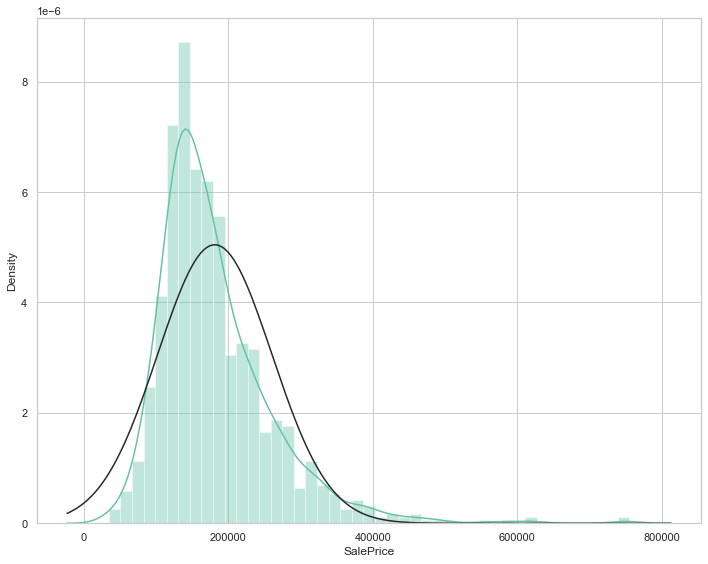

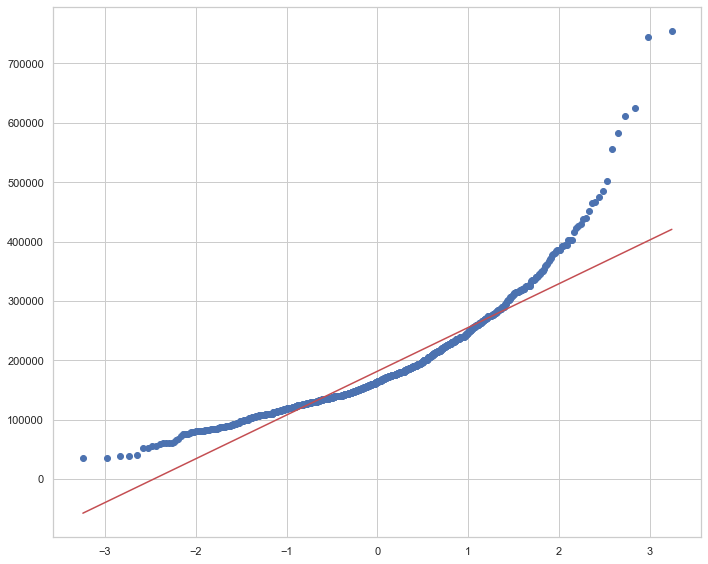

In [100]:
sns.distplot(df.SalePrice,fit=norm);
plt.ylabel =('Frequency')
plt.title = ('SalePrice Distribution');
#Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['SalePrice']);
#QQ plot
fig = plt.figure()
res = stats.probplot(df['SalePrice'], plot=plt)
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


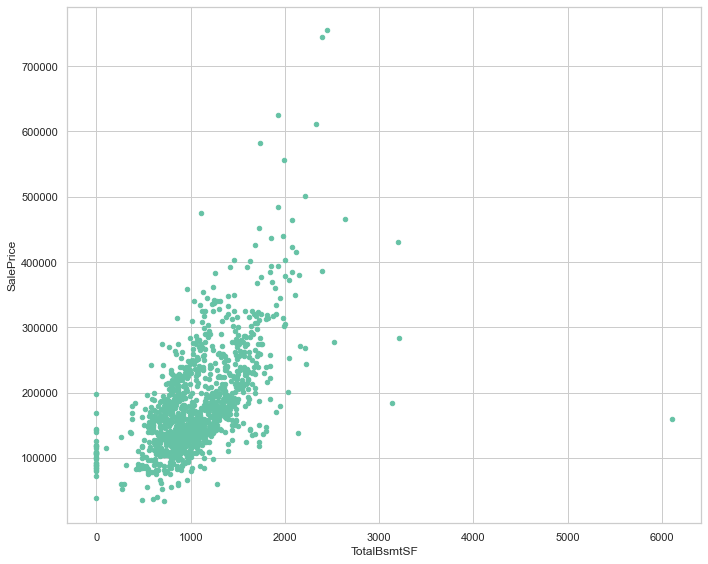

In [101]:
var ='TotalBsmtSF'
data = pd.concat([df['SalePrice'],df[var]],axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim =0.800000);
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


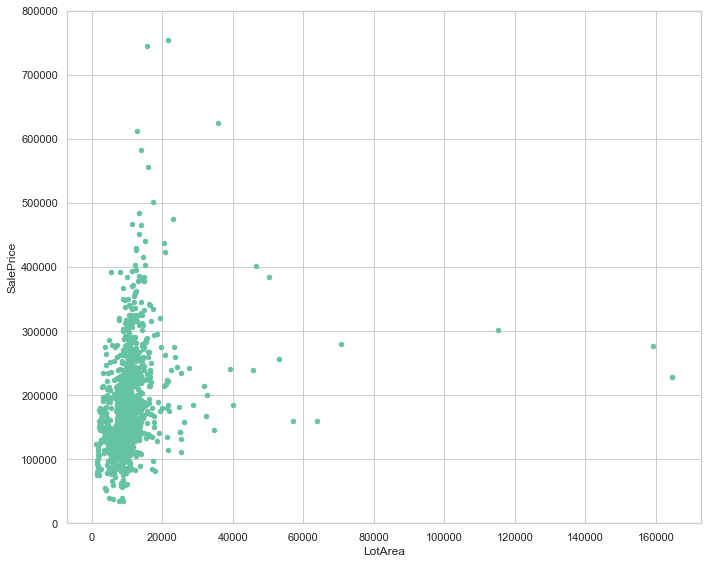

In [102]:
#scatter plot LotArea/salePrice
var = 'LotArea'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
data.plot.scatter(x= var, y='SalePrice', ylim =(0,800000));
plt.show();

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


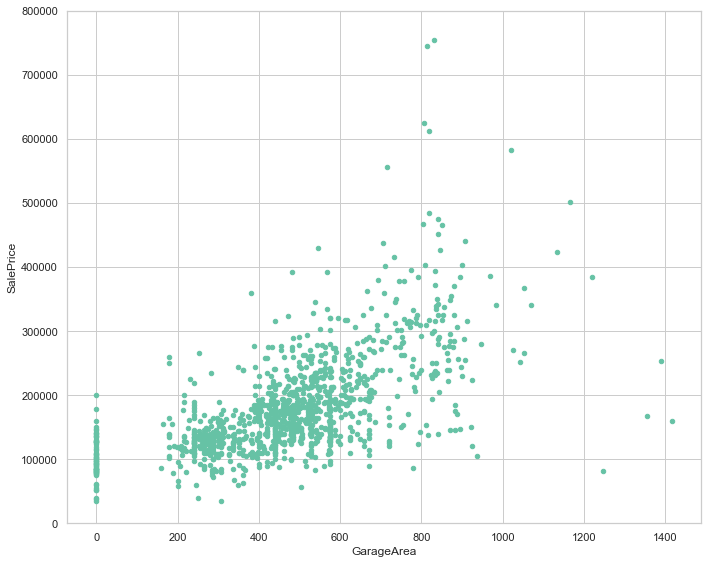

In [103]:
#scatter plot GarageArea/SalePrice
var = 'GarageArea'
data =pd.concat([df['SalePrice'], df[var]], axis=1)
data.plot.scatter(x=var,y='SalePrice', ylim= (0,800000));
plt.show()

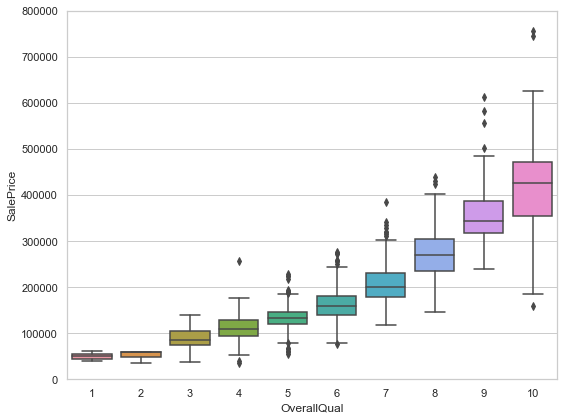

In [104]:
var = 'OverallQual'
data = pd.concat([df['SalePrice'], df[var]], axis=1)
f, ax =plt.subplots(figsize=(8,6))
fig = sns.boxplot(x=var, y='SalePrice', data=data)
fig.axis(ymin=0, ymax=800000)
plt.show();

> ## Outlier Detection & Removal

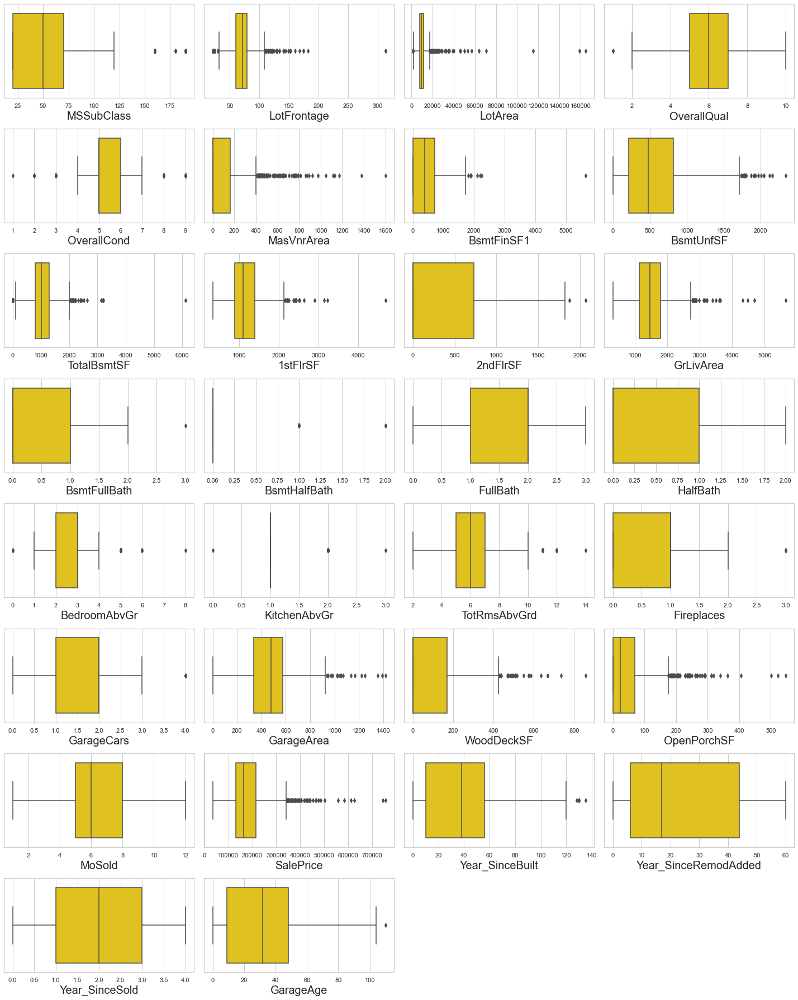

In [105]:
# Identifying the outliers using boxplot in train dataset

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_data:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df[column],color='gold')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

**We can see lot of features contain outliers which are in upper bound limit i.e. extreme outliers. We also know that value present in dataset are realsitic in nature, so to gain accuracy of model we cannot afford large data loss.**


- **BsmtFinSF1: Type 1 finished square feet**

- **BsmtFinSF2: Type 2 finished square feet**

- **BsmtUnfSF: Unfinished square feet of basement area**

- **TotalBsmtSF: Total square feet of basement area**

***TotalBsmtSF is sum of above remaining features. We will drop other three features for modelling.***

In [51]:
df.drop(['BsmtFinSF1','BsmtUnfSF'],axis=1,inplace=True)
test_data.drop(['BsmtFinSF1','BsmtUnfSF'],axis=1,inplace=True)

- **1stFlrSF: First Floor square feet**
 
- **2ndFlrSF: Second floor square feet**

- **LowQualFinSF: Low quality finished square feet (all floors)**

- **GrLivArea: Above grade (ground) living area square feet**

***GrLivArea is sum of above remaining features. We will drop other three features for modelling.***

In [52]:
df.drop(['1stFlrSF','2ndFlrSF'],axis=1,inplace=True)
test_data.drop(['1stFlrSF','2ndFlrSF'],axis=1,inplace=True)

In [53]:
df.shape

(1168, 64)

In [54]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,1078,GasA,TA,Y,SBrkr,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,3,33.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,2217,GasA,Ex,Y,SBrkr,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,3,40.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,1117,GasA,Ex,Y,SBrkr,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,3,13.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,1844,GasA,Ex,Y,SBrkr,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,COD,Normal,190000,33,33,0,33.0
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,1602,GasA,Gd,Y,SBrkr,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,Fin,2,529,TA,TA,Y,240,0,6,WD,Normal,215000,33,10,1,33.0


> ## Z Score Method

**Outliers are applicable to only continous numerical data so now we will detect and remove outliers in continous numerical features.**

### Outlier Removal in Train data

In [55]:
#Features having outliers in train dataset

features=df[['LotFrontage','LotArea','MasVnrArea','TotalBsmtSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF']]

In [56]:
from scipy.stats import zscore

In [57]:
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,1078,GasA,TA,Y,SBrkr,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,3,33.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,2217,GasA,Ex,Y,SBrkr,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,3,40.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,1117,GasA,Ex,Y,SBrkr,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,3,13.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,1844,GasA,Ex,Y,SBrkr,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,COD,Normal,190000,33,33,0,33.0
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,1602,GasA,Gd,Y,SBrkr,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,Fin,2,529,TA,TA,Y,240,0,6,WD,Normal,215000,33,10,1,33.0


In [58]:
df_new.shape

(1081, 64)

In [59]:
df.shape

(1168, 64)

In [60]:
#Checking dataloss in IQR method of train dataset
Dataloss = (((1168-1081)/1168)*100)
Dataloss

7.448630136986302

- **Data Loss in Test data is 7.44% which is acceptable.**

### Outliers Removal in Test Dataset

In [61]:
#Features having outliers in test dataset
features1=test_data[['LotFrontage','LotArea','MasVnrArea','TotalBsmtSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF']]

In [62]:
from scipy.stats import zscore
z=np.abs(zscore(features1))
test_new=test_data[(z<3).all(axis=1)]
test_new.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,20,RL,86.000000,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,Unf,0,1922,GasA,Ex,Y,SBrkr,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,0,7,WD,Normal,4,4,3,5.0
1,120,RL,66.425101,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,Unf,0,1220,GasA,Gd,Y,SBrkr,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,0,8,COD,Abnorml,25,26,1,26.0
2,20,RL,66.425101,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,Unf,0,1753,GasA,Ex,Y,SBrkr,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,0,6,WD,Normal,8,9,1,9.0
3,70,RL,75.000000,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,Unf,0,704,GasA,Ex,Y,SBrkr,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,0,7,WD,Normal,68,60,1,69.0
4,60,RL,86.000000,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,Unf,0,894,GasA,Ex,Y,SBrkr,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,0,1,WD,Normal,2,3,2,3.0


In [63]:
#Checking shape of new test dataset
test_new.shape

(267, 70)

In [64]:
test_data.shape

(292, 70)

In [65]:
#Checking dataloss in Z score method method of test dataset
Dataloss = (((292-267)/292)*100)
Dataloss

8.561643835616438

- **Data Loss in Test data is 8.56% which is acceptable.**

In [84]:
# here we are removing unwanted features from test data

test_data.drop(['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1,inplace=True)

> ## Skewness Detection and Transformation

**In this section we will check the skewness in continous numerical features and transform if needed.**

#### Skewness in train dataset

In [66]:
features=['LotFrontage','LotArea','MasVnrArea','TotalBsmtSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF']

In [67]:
#Checking for skewness of train dataset
df_new[features].skew()

LotFrontage    0.108193
LotArea        1.156426
MasVnrArea     1.673386
TotalBsmtSF    0.089837
GrLivArea      0.556080
GarageArea    -0.109857
WoodDeckSF     1.015107
OpenPorchSF    1.482694
dtype: float64

In [68]:
#Checking for skewness of test dataset
test_new[features].skew()

LotFrontage   -0.072510
LotArea        1.744857
MasVnrArea     1.565731
TotalBsmtSF    0.202197
GrLivArea      0.587889
GarageArea     0.114048
WoodDeckSF     1.257653
OpenPorchSF    1.639297
dtype: float64

### Removing skewness using yeo-johnson method for train dataset:

In [69]:
#Creating a list of skewed features in train dataset
fea=['LotArea','MasVnrArea','WoodDeckSF','OpenPorchSF']

In [70]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [71]:
df_new_2=df_new.copy()

In [72]:
df_new_2[fea] = scaler.fit_transform(df_new_2[fea].values)

In [73]:
#Checking skewness again in train dataset
df_new_2[fea].skew()

LotArea        0.125242
MasVnrArea     0.451274
WoodDeckSF     0.137472
OpenPorchSF    0.037270
dtype: float64

- **All Numerical Features in train dataset are transform within permissible limit of -0.5 to 0.5.**

### Removing skewness using yeo-johnson method for test dataset:

In [74]:
test_new_2=test_new.copy()

In [75]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [76]:
test_new_2[fea] = scaler.fit_transform(test_new_2[fea].values)

In [77]:
#Checking skewness again in test dataset
test_new_2[fea].skew()

LotArea        0.147540
MasVnrArea     0.411574
WoodDeckSF     0.250713
OpenPorchSF   -0.065385
dtype: float64

- **All Numerical Features in test dataset are transform within permissible limit of -0.5 to 0.5.**

In [78]:
# Rename dataframe
df = df_new_2
test_data = test_new_2

> ## Encoding Categorical Variable

### Encoding for Training data

In [79]:
Categorical_features = ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
                        'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
                        'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 
                        'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
                        'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 
                        'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
                        'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 
                        'SaleCondition']

#### 3.2 Encoding for Testing data

In [80]:
# Using Label encoder for transforming Categorical data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in Categorical_features:
    df[i] = le.fit_transform(df[i])
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,3,70.98847,-1.289031,1,0,3,4,0,13,2,2,4,2,6,5,1,0,8,9,2,-0.807106,3,4,1,2,3,3,0,5,1078,1,4,1,4,958,0,0,2,0,2,1,3,5,5,1,4,1,1,2,440,4,4,2,-0.945425,1.446777,2,8,4,128000,34,34,3,33.0
1,20,3,95.00000,1.589613,1,0,3,4,1,12,2,2,0,2,8,6,0,3,12,13,2,-0.807106,2,2,2,3,1,1,0,4,2217,1,0,1,4,2217,1,0,2,0,4,1,2,8,5,1,4,1,2,2,621,4,4,2,0.824603,1.450927,10,8,4,268000,40,40,3,40.0
2,60,3,92.00000,0.193136,1,0,3,1,0,15,2,2,0,5,7,5,1,0,7,7,2,-0.807106,2,4,2,2,3,0,2,5,1117,1,0,1,4,2013,1,0,2,1,3,1,3,8,5,1,4,1,2,2,455,4,4,2,1.080232,1.251061,6,8,4,269790,14,13,3,13.0
3,20,3,105.00000,0.653154,1,0,3,4,0,14,2,2,0,2,6,6,3,0,8,9,1,1.416165,3,4,1,2,3,3,1,5,1844,1,0,1,4,1844,0,0,2,0,3,1,3,7,5,1,4,1,1,2,546,4,4,2,-0.945425,1.223616,1,0,4,190000,33,33,0,33.0
4,20,3,70.98847,1.753133,1,0,3,2,0,14,2,2,0,2,6,7,1,0,4,4,3,1.188798,2,4,1,2,3,3,0,5,1602,1,2,1,4,1602,0,1,2,0,3,1,2,8,5,1,4,1,0,2,529,4,4,2,1.168655,-1.025453,6,8,4,215000,33,10,1,33.0


###  Encoding for Testing data

In [83]:
# Using Label encoder for transforming Categorical data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in Categorical_features:
    test_data[i] = le.fit_transform(test_data[i])
test_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,20,2,86.000000,1.152882,1,0,1,0,0,21,2,0,0,2,9,5,3,0,9,11,3,1.236320,2,3,2,0,2,1,2,5,0,1922,0,0,1,3,0,1922,1,0,2,0,3,1,2,8,5,1,2,0,0,3,676,4,4,2,1.163722,0.779560,0,0,0,0,0,7,5,2,4,4,3,5.0
1,120,2,66.425101,-0.855360,1,0,3,1,0,21,2,0,4,2,8,5,1,0,5,5,2,-0.825182,2,3,1,2,2,0,2,5,0,1220,0,2,1,3,0,1360,1,0,1,0,1,1,2,4,5,1,0,0,1,2,565,4,4,2,0.873062,-1.097572,0,0,0,0,0,8,0,0,25,26,1,26.0
2,20,2,66.425101,0.672142,1,3,3,4,0,4,2,0,0,2,8,5,3,0,9,11,2,-0.825182,2,3,2,2,2,0,5,5,0,1753,0,0,1,3,0,1788,0,0,2,0,3,1,0,7,5,1,4,0,1,2,522,4,4,2,1.196283,1.360492,0,0,0,0,0,6,5,2,8,9,1,9.0
3,70,2,75.000000,0.707134,1,3,0,4,0,5,2,0,0,4,7,7,1,0,6,7,2,-0.825182,3,3,1,3,2,3,4,5,0,704,0,0,1,3,0,1564,0,0,1,1,3,1,1,7,5,1,2,0,2,1,234,4,4,2,-0.891816,-1.097572,0,0,0,0,0,7,5,2,68,60,1,69.0
4,60,2,86.000000,1.239855,1,0,3,1,0,20,1,0,0,4,6,5,1,0,9,11,3,1.021062,2,3,2,2,2,2,5,5,0,894,0,0,1,3,0,1933,0,0,2,1,4,1,2,9,5,1,2,2,0,3,668,4,4,2,1.007575,0.263438,0,0,0,0,0,1,5,2,2,3,2,3.0


> # Checking correlation using heat map:

In [86]:
#Correlation of train dataset
df.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
MSSubClass,1.000000,0.020419,-0.411612,-0.426634,0.001821,0.092759,-0.013067,0.084583,-0.022390,0.005679,-0.045778,-0.075221,0.741638,0.392763,0.096066,-0.066891,-0.099065,-0.005062,-0.086519,-0.116872,-0.006722,0.013936,-0.036968,0.014819,0.063348,-0.074596,-0.002671,-0.074846,0.022235,0.047521,-0.235418,0.044542,0.000931,-0.112376,0.052091,0.099609,0.014976,0.007075,0.148391,0.178539,-0.044522,0.283909,-0.020329,0.043721,0.012946,-0.026837,0.033873,0.069707,-0.012395,-0.028562,-0.100039,-0.006950,-0.024626,-0.069991,0.028188,0.032294,-0.012146,0.025385,-0.017798,-0.058174,-0.035668,-0.058401,0.029670,-0.078536
MSZoning,0.020419,1.000000,-0.099430,-0.077716,0.105095,0.068035,-0.001214,-0.021882,-0.038321,-0.264104,-0.021587,0.028807,-0.012207,-0.108923,-0.168372,0.176552,0.013214,-0.003715,-0.015420,-0.002358,-0.051381,-0.025874,0.208182,-0.087721,-0.245761,0.130853,0.000528,0.044541,0.018135,-0.030317,-0.081303,0.034683,0.140750,-0.019156,-0.097677,-0.093839,-0.019315,0.003308,-0.214298,-0.123009,-0.002920,0.031632,0.130258,-0.036559,-0.091072,-0.002369,-0.003428,0.145288,0.172865,-0.140338,-0.187768,-0.162322,-0.090343,-0.091626,0.000398,-0.189065,-0.048095,0.074377,-0.010733,-0.183718,0.309607,0.189190,-0.001195,0.264316
LotFrontage,-0.411612,-0.099430,1.000000,0.595167,-0.010107,-0.150524,0.025758,-0.200903,0.006728,0.107039,-0.015890,-0.033474,-0.476511,0.043370,0.192388,-0.039163,0.154085,0.052146,0.073235,0.110576,-0.092686,0.168665,-0.113373,0.052332,0.063342,-0.150164,0.048695,-0.095973,-0.035495,-0.028976,0.307262,-0.046837,-0.036573,0.085357,0.071023,0.306903,0.044927,-0.004726,0.152213,0.030617,0.269434,0.019660,-0.114923,0.299613,0.027510,0.209586,0.110402,-0.256608,-0.170154,0.266357,0.312117,0.042026,0.039008,0.112670,0.042442,0.160468,0.029773,-0.035968,0.086361,0.345751,-0.117057,-0.064671,0.017097,-0.047867
LotArea,-0.426634,-0.077716,0.595167,1.000000,-0.011735,-0.264699,-0.018428,-0.182382,0.076878,0.088329,0.070672,0.024379,-0.529712,-0.000736,0.137011,-0.005013,0.133041,0.111283,0.081877,0.100805,-0.041747,0.073506,-0.046438,0.000697,0.014592,-0.078241,0.003402,-0.104079,-0.028571,-0.055911,0.294067,-0.007015,-0.001923,0.051149,0.030617,0.360072,0.079890,0.017165,0.166433,0.052813,0.296347,0.025005,-0.064365,0.343783,-0.020171,0.288021,0.135696,-0.208418,-0.118812,0.221386,0.272319,0.029748,0.040861,0.030353,0.093882,0.116099,0.025409,-0.024052,0.055532,0.340063,-0.033207,-0.002010,0.038163,0.020550
Street,0.001821,0.105095,-0.010107,-0.011735,1.000000,-0.031276,0.080699,-0.025503,-0.078632,0.028930,0.001063,-0.000756,-0.018079,-0.022236,0.016887,0.022878,-0.033261,0.004152,0.001764,0.004063,0.018941,-0.007365,0.038512,0.042212,0.023539,-0.009368,-0.012715,0.086721,-0.015797,-0.013196,0.039239,0.004851,-0.058996,0.074198,0.068401,0.052115,-0.007397,0.010181,0.043042,0.032081,0.019989,0.009309,0.020129,0.055160,-0.010834,0.039413,0.018929,0.018089,-0.039748,0.043505,0.045244,-0.009095,-0.008185,0.072815,0.040703,0.008316,0.013701,-0.014007,0.030017,0.055711,0.000525,-0.027311,0.022459,-0.022649
LotShape,0.092759,0.068035,-0.150524,-0.264699,-0.031276,1.000000,0.067062,0.202118,-0.069203,-0.032082,-0.140911,-0.012758,0.091200,-0.126715,-0.176984,0.032542,-0.007609,-0.029897,-0.033402,-0.037146,-0.006995,

Above are the correlations of all the pair of features of train dataset.To get better visualization on the correlation of features,let me plot it using heat map.

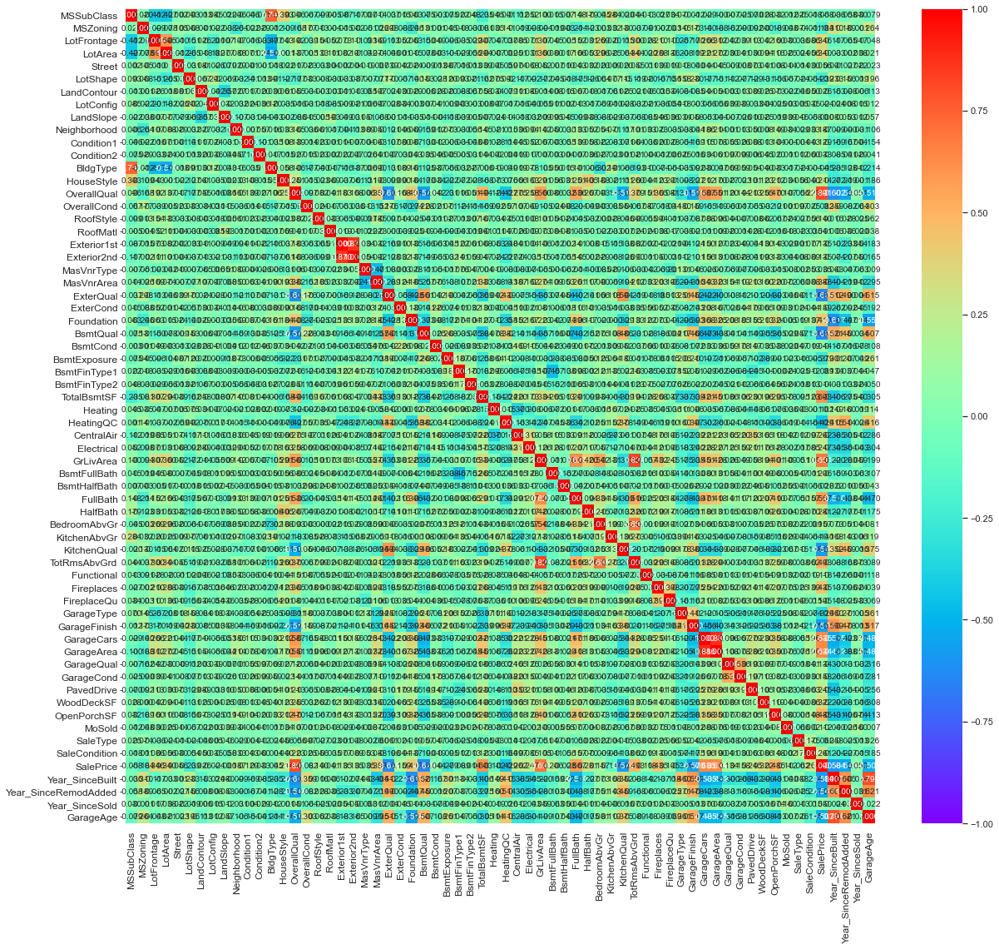

In [87]:
plt.figure(figsize=(18,16))
sns.heatmap(df.corr(),linecolor='black', vmin=-1, vmax=1, annot=True, square=False, fmt='0.3f', 
            annot_kws={'size':10}, cmap="rainbow")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

I can clearly observe a multicolinearity issue in some of the features of train dataset so i have to check VIF and Let me plot a bar graph to get better insight on targets correlation with other features.

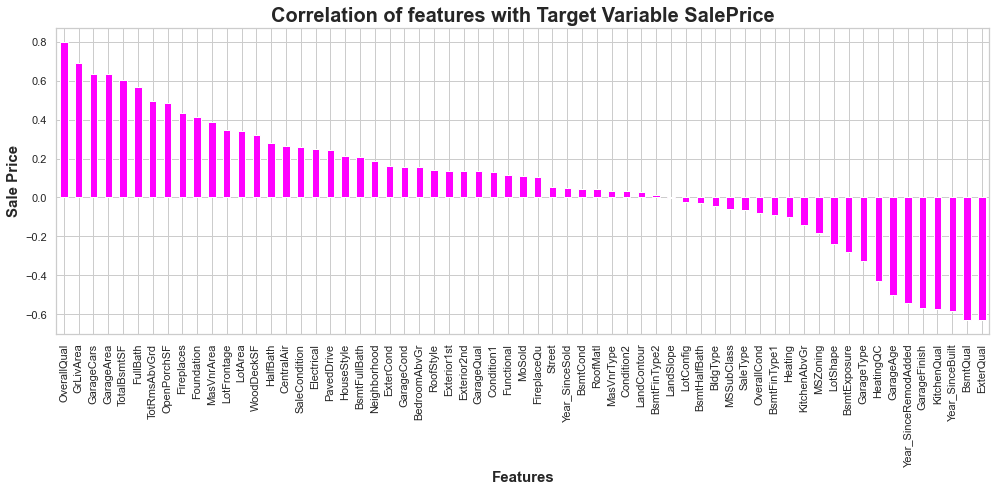

In [89]:
plt.figure(figsize = (14,7))
df.corr()['SalePrice'].drop(['SalePrice']).sort_values(ascending=False).plot(kind='bar',cmap = 'spring')
plt.xlabel('Features',fontsize=15,fontweight='bold')
plt.ylabel('Sale Price',fontsize=15,fontweight='bold')
plt.title('Correlation of features with Target Variable SalePrice',fontsize = 20,fontweight='bold')
plt.tight_layout()
plt.show()

we can cleary see that MasVnrtype and ForeplaceQu are less correlated with target.

> ##  Standard Scaling

#### Separating features and label in train dataset:

In [90]:
x = df.drop("SalePrice",axis=1)
y = df["SalePrice"]

- **Standard Scaling on Train data**

In [91]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_scale= pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

- **Scaling the test data**

In [92]:
from sklearn.preprocessing import StandardScaler
X_scale_test = scaler.fit_transform(test_data)

> ## Multicolinearity check using VIF:

In [93]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x_scale.values, i) for i in range(x_scale.shape[1])]
vif["Features"]=x_scale.columns
vif

,vif_Features,Features
0,5.111609,MSSubClass
1,1.378483,MSZoning
2,2.101520,LotFrontage
3,2.327851,LotArea
4,1.089920,Street
5,1.274843,LotShape
6,1.264216,LandContour
7,1.153170,LotConfig
8,1.363359,LandSlope
9,1.276373,Neighborhood


In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x_scale.values, i) for i in range(x_scale.shape[1])]
vif["Features"]=x_scale.columns
vif

,vif_Features,Features
0,5.111609,MSSubClass
1,1.378483,MSZoning
2,2.101520,LotFrontage
3,2.327851,LotArea
4,1.089920,Street
5,1.274843,LotShape
6,1.264216,LandContour
7,1.153170,LotConfig
8,1.363359,LandSlope
9,1.276373,Neighborhood


**For all features value of VIF is less than permissible limit of 10.**

# MODEL BUILDING USING TRAIN DATASET:

In [118]:
#importing necessary libraries
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [98]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state=99, test_size=.3)
print('Training feature matrix size:',X_train.shape)
print('Training target vector size:',Y_train.shape)
print('Test feature matrix size:',X_test.shape)
print('Test target vector size:',Y_test.shape)

Training feature matrix size: (756, 63)
Training target vector size: (756,)
Test feature matrix size: (325, 63)
Test target vector size: (325,)


## Finding best Random state for model building

In [99]:
maxR2_score=0
maxRS=0
for i in range(50,500):
    X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state=i, test_size=.33)
    lin_reg=LinearRegression()
    lin_reg.fit(X_train,Y_train)
    y_pred=lin_reg.predict(X_test)
    R2=r2_score(Y_test,y_pred)
    if R2>maxR2_score:
        maxR2_score=R2
        maxRS=i
print('Best R2 Score is', maxR2_score ,'on Random_state', maxRS)

Best R2 Score is 0.9088451799308987 on Random_state 67


In [100]:
X_train,X_test,y_train,y_test=train_test_split(x_scale,y,test_size=.30,random_state=maxRS)

### **Linear Regression**

In [103]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state= 67, test_size=0.3)
lin_reg= LinearRegression()
lin_reg.fit(X_train, Y_train)
y_pred = lin_reg.predict(X_test)
print('\033[1m'+ 'Error :'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+' R2 Score :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error :
Mean absolute error : 16220.38704551424
Mean squared error : 440199736.42632115
Root Mean squared error : 20980.93745346764
 R2 Score :
90.97874595398667


In [104]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(lin_reg, x_scale, y, cv=5)
print('\033[1m'+'Cross Validation Score :',lin_reg,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : LinearRegression() :

Mean CV Score : 0.8639902772290837
Difference in R2 & CV Score: 4.579718231078303


### **Random Forest Regressor**

In [105]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state= 67, test_size=0.3)
rfc = RandomForestRegressor()
rfc.fit(X_train, Y_train)
y_pred = rfc.predict(X_test)
print('\033[1m'+ 'Error of Random Forest Regressor:'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+'R2 Score of Random Forest Regressor :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error of Random Forest Regressor:
Mean absolute error : 16219.685138461538
Mean squared error : 527374213.31466556
Root Mean squared error : 22964.629614140646
R2 Score of Random Forest Regressor :
89.19223170315476


In [106]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(rfc, x_scale,y, cv=5)
print('\033[1m'+'Cross Validation Score :',rfc,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : RandomForestRegressor() :

Mean CV Score : 0.8500661950066606
Difference in R2 & CV Score: 4.185612202488699


### **Decision Tree Regressor**

In [107]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state= 67, test_size=0.3)
dtc = DecisionTreeRegressor()
dtc.fit(X_train, Y_train)
y_pred = dtc.predict(X_test)
print('\033[1m'+ 'Error of Decision Tree Regressor:'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+'R2 Score of Decision Tree Regressor :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error of Decision Tree Regressor:
Mean absolute error : 26972.593846153846
Mean squared error : 1610413447.0
Root Mean squared error : 40129.95697730064
R2 Score of Decision Tree Regressor :
66.9969161216555


In [108]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtc, x_scale, y, cv=5)
print('\033[1m'+'Cross Validation Score :',dtc,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : DecisionTreeRegressor() :

Mean CV Score : 0.7080968567577701
Difference in R2 & CV Score: -3.812769554121516


###  **XGboost regressor Model**

In [109]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state= 67, test_size=0.3)
xgb = XGBRegressor()
xgb.fit(X_train, Y_train)
y_pred = xgb.predict(X_test)
print('\033[1m'+ 'Error of XGB Regressor:'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+'R2 Score of XGB Regressor :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error of XGB Regressor:
Mean absolute error : 16791.58171875
Mean squared error : 519666161.29794323
Root Mean squared error : 22796.187428996614
R2 Score of XGB Regressor :
89.35019703045654


In [110]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(xgb, x_scale, y, cv=5)
print('\033[1m'+'Cross Validation Score :',xgb,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...) :

Mean CV Score : 0.8534095448294791
Difference in R2 & CV Score: 4.009242547508634


### **Extra Tree Regressor**

In [111]:
X_train, X_test, Y_train, Y_test = train_test_split(x_scale, y, random_state= 135, test_size=0.33)
etc = ExtraTreesRegressor()
etc.fit(X_train, Y_train)
y_pred = etc.predict(X_test)
print('\033[1m'+ 'Error of Extra Tree Regressor:'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+'R2 Score of Extra Tree Regressor :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error of Extra Tree Regressor:
Mean absolute error : 15806.354285714284
Mean squared error : 588334423.1789567
Root Mean squared error : 24255.606015495814
R2 Score of Extra Tree Regressor :
85.40138230100101


In [112]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(etc, x_scale, y, cv=5)
print('\033[1m'+'Cross Validation Score :',etc,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : ExtraTreesRegressor() :

Mean CV Score : 0.8448553057881286
Difference in R2 & CV Score: 0.915851722188151


###  **Gradient Boosting Regressor**

In [120]:
X_train,X_test,y_train,y_test=train_test_split(x_scale,y,test_size=.30,random_state=67)
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
y_pred = GBR.predict(X_test)
print('\033[1m'+ 'Error of Gradient Boosting Regressor:'+ '\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test, y_pred))
print('Root Mean squared error :', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('\033[1m'+'R2 Score of Gradient Boosting Regressor :'+'\033[0m')
print(r2_score(Y_test,y_pred)*100)

Error of Gradient Boosting Regressor:
Mean absolute error : 14603.432936277464
Mean squared error : 411182388.89535934
Root Mean squared error : 20277.632724146064
R2 Score of Gradient Boosting Regressor :
91.57341433326245


In [121]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(GBR, x_scale, y, cv=5)
print('\033[1m'+'Cross Validation Score :',GBR,":"+'\033[0m\n')
print("Mean CV Score :",score.mean())
print('Difference in R2 & CV Score:',(r2_score(Y_test,y_pred)*100)-(score.mean()*100))

Cross Validation Score : GradientBoostingRegressor() :

Mean CV Score : 0.8678279156121096
Difference in R2 & CV Score: 4.790622772051492


***We can see that Gradient Boosting Regressor gives maximum R2 score of 91.5734 and with cross validation score of 86.78 %.***

# Hyper Parameter Tuning : GridSearchCV

In [122]:
from sklearn.model_selection import GridSearchCV

In [123]:
print(GBR.get_params())

{'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [126]:
parameters = [{   'learning_rate': [0.01,0.1,1],
                  'subsample'    : [1, 0.8, 0.6],
                  'n_estimators' : [75,100,150],
                  'max_depth'    : [3,4,6]}] 

In [127]:
GCV = GridSearchCV(GradientBoostingRegressor(),parameters,cv=5,verbose=10)
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV 1/5; 1/81] START learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1
[CV 1/5; 1/81] END learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1;, score=0.571 total time=   0.1s
[CV 2/5; 1/81] START learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1
[CV 2/5; 1/81] END learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1;, score=0.618 total time=   0.2s
[CV 3/5; 1/81] START learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1
[CV 3/5; 1/81] END learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1;, score=0.518 total time=   0.1s
[CV 4/5; 1/81] START learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1
[CV 4/5; 1/81] END learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1;, score=0.534 total time=   0.1s
[CV 5/5; 1/81] START learning_rate=0.01, max_depth=3, n_estimators=75, subsample=1
[CV 5/5; 1/81] END learning_rate=0.01, max_depth=3, n_estimators=75

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid=[{'learning_rate': [0.01, 0.1, 1],
                          'max_depth': [3, 4, 6],
                          'n_estimators': [75, 100, 150],
                          'subsample': [1, 0.8, 0.6]}],
             verbose=10)

In [133]:
GCV.best_params_

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 75, 'subsample': 0.8}

In [134]:
GCV.best_score_

0.8644892715347028

# Final Model

In [141]:
#Final_mod = GradientBoostingRegressor(learning_rate=0.1 ,n_estimators= 100, max_depth=3 ,subsample=0.8)
Final_mod = GradientBoostingRegressor(learning_rate=0.1 ,n_estimators= 75, max_depth=4 ,subsample=0.8)

Final_mod.fit(X_train,Y_train)
pred=Final_mod.predict(X_test)
print('\n')                                        
print('\033[1m'+' Error in Final Model :' +'\033[0m')
print('Mean absolute error :', mean_absolute_error(Y_test,pred))
print('Mean squared error :', mean_squared_error(Y_test,pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test,pred)))
print('\n')
print('\033[1m'+' R2 Score of Final Model :'+'\033[0m')
print(r2_score(Y_test,pred)) 
print('\n')



 Error in Final Model :
Mean absolute error : 14811.609409758214
Mean squared error : 424650205.7933105
Root Mean Squared Error: 20607.04262608564


 R2 Score of Final Model :
0.912974109928971




 True Values Vs Predicted Value plot :


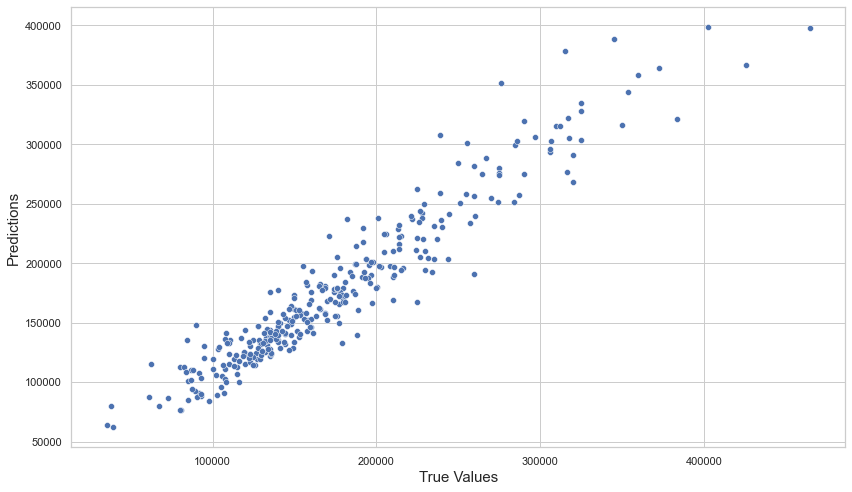

In [142]:
plt.figure(figsize=(12,7))
y_pred=Final_mod.predict(X_test)
sns.scatterplot(Y_test.round(2), pred)
print('\033[1m'+' True Values Vs Predicted Value plot :' +'\033[0m')
plt.xlabel('True Values' , fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()

<AxesSubplot:>

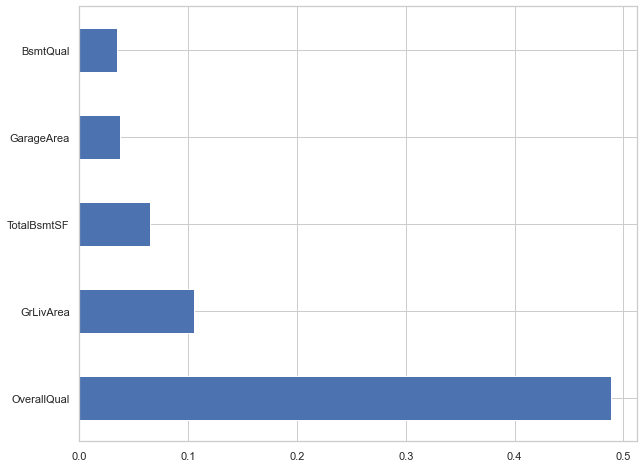

In [143]:
feat_importances = pd.Series(Final_mod.feature_importances_, index=x_scale.columns)
feat_importances = feat_importances.nlargest()
feat_importances.plot(kind='barh')

## Saving Final Model

In [144]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_mod,"Surprise_Housing_Price_Prediction.pkl")

['Surprise_Housing_Price_Prediction.pkl']

In [145]:
X_scale_test.shape

(267, 63)

## **Predictions of Test Dataset Using Final Model**

In [147]:
# Loading the saved model
model = joblib.load("Surprise_Housing_Price_Prediction.pkl")

# Prediction
prediction = model.predict(X_scale_test)
prediction

array([338038.95410719, 219582.29483409, 273370.98318063, 203497.8430996 ,
       192225.23299848,  88629.69840276, 130721.56559997, 282689.21418322,
       227662.92921124,  81869.53177334, 143880.85345372, 116250.84369909,
       327990.38850514, 125218.48730329, 119337.22367641, 124564.52041732,
       165669.18686394, 202713.26507694, 164543.77869955, 145708.90637001,
       147212.91362965,  79058.14978165,  96436.69141875, 130303.00227052,
       169137.22573233, 144981.99058575, 170261.07574048,  97910.04683662,
       139908.69806154, 188772.722648  , 236268.45507038, 171658.48967676,
       111818.09876107, 167079.39600281, 182077.04321651, 125201.22789442,
       180853.98320967, 157079.55863005, 103249.28561215, 307146.6406758 ,
       197439.0654021 , 186268.75206329, 139723.7955933 , 128659.9924825 ,
       139031.81622324,  93430.93709757, 200166.48278608, 298283.81332119,
       135832.97523865, 195238.82471111, 102003.04967343, 102547.93231395,
       130117.6158138 , 1

In [148]:
# Predicting the Item_Outlet_Sales from the feature columns of our Testing dataset
Test_data_Predication = pd.DataFrame()
Test_data_Predication['SalePrice']=prediction
Test_data_Predication.head()

,SalePrice
0,338038.954107
1,219582.294834
2,273370.983181
3,203497.843100
4,192225.232998


In [149]:
Final_test_data = pd.concat([test_data, Test_data_Predication], axis=1)
Final_test_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge,SalePrice
0,20.0,2.0,86.000000,1.152882,1.0,0.0,1.0,0.0,0.0,21.0,2.0,0.0,0.0,2.0,9.0,5.0,3.0,0.0,9.0,11.0,3.0,1.236320,2.0,3.0,2.0,0.0,2.0,1.0,2.0,5.0,1922.0,0.0,0.0,1.0,3.0,1922.0,1.0,0.0,2.0,0.0,3.0,1.0,2.0,8.0,5.0,1.0,2.0,0.0,0.0,3.0,676.0,4.0,4.0,2.0,1.163722,0.779560,7.0,5.0,2.0,4.0,4.0,3.0,5.0,338038.954107
1,120.0,2.0,66.425101,-0.855360,1.0,0.0,3.0,1.0,0.0,21.0,2.0,0.0,4.0,2.0,8.0,5.0,1.0,0.0,5.0,5.0,2.0,-0.825182,2.0,3.0,1.0,2.0,2.0,0.0,2.0,5.0,1220.0,0.0,2.0,1.0,3.0,1360.0,1.0,0.0,1.0,0.0,1.0,1.0,2.0,4.0,5.0,1.0,0.0,0.0,1.0,2.0,565.0,4.0,4.0,2.0,0.873062,-1.097572,8.0,0.0,0.0,25.0,26.0,1.0,26.0,219582.294834
2,20.0,2.0,66.425101,0.672142,1.0,3.0,3.0,4.0,0.0,4.0,2.0,0.0,0.0,2.0,8.0,5.0,3.0,0.0,9.0,11.0,2.0,-0.825182,2.0,3.0,2.0,2.0,2.0,0.0,5.0,5.0,1753.0,0.0,0.0,1.0,3.0,1788.0,0.0,0.0,2.0,0.0,3.0,1.0,0.0,7.0,5.0,1.0,4.0,0.0,1.0,2.0,522.0,4.0,4.0,2.0,1.196283,1.360492,6.0,5.0,2.0,8.0,9.0,1.0,9.0,273370.983181
3,70.0,2.0,75.000000,0.707134,1.0,3.0,0.0,4.0,0.0,5.0,2.0,0.0,0.0,4.0,7.0,7.0,1.0,0.0,6.0,7.0,2.0,-0.825182,3.0,3.0,1.0,3.0,2.0,3.0,4.0,5.0,704.0,0.0,0.0,1.0,3.0,1564.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,7.0,5.0,1.0,2.0,0.0,2.0,1.0,234.0,4.0,4.0,2.0,-0.891816,-1.097572,7.0,5.0,2.0,68.0,60.0,1.0,69.0,203497.843100
4,60.0,2.0,86.000000,1.239855,1.0,0.0,3.0,1.0,0.0,20.0,1.0,0.0,0.0,4.0,6.0,5.0,1.0,0.0,9.0,11.0,3.0,1.021062,2.0,3.0,2.0,2.0,2.0,2.0,5.0,5.0,894.0,0.0,0.0,1.0,3.0,1933.0,0.0,0.0,2.0,1.0,4.0,1.0,2.0,9.0,5.0,1.0,2.0,2.0,0.0,3.0,668.0,4.0,4.0,2.0,1.007575,0.263438,1.0,5.0,2.0,2.0,3.0,2.0,3.0,192225.232998


In [150]:
Final_test_data.to_csv('Test Data Prediction using GradBoost.csv')